In [1]:
# 建筑不变：能耗变化是由于外部天气变化和人的使用（内扰外扰）。

In [2]:
import keras
import shap
import tensorflow

print("Shap:", shap.__version__)
print("Kears:", keras.__version__)
print("TensorFlow:", tensorflow.__version__)


Shap: 0.47.1
Kears: 2.15.0
TensorFlow: 2.15.0


In [3]:
from tensorflow.keras.datasets import imdb
from tensorflow.keras.layers import LSTM, Dense, Embedding, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras import backend as K

import tensorflow as tf
tf.compat.v1.disable_eager_execution()
tf.compat.v1.disable_v2_behavior()
from tqdm import tqdm


Instructions for updating:
non-resource variables are not supported in the long term


In [4]:
import os,re
import math
import random
import copy

import numpy as np
import pandas as pd
import scipy as sp
import scipy.cluster
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, leaders
from scipy.cluster import hierarchy
import scipy.stats
from scipy.stats import pearsonr
from scipy.stats import linregress

import seaborn as sns; 
# sns.set_theme(style="whitegrid")
from statsmodels.nonparametric.smoothers_lowess import lowess

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
from sklearn.metrics import mean_squared_error
from matplotlib import cm
from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec
# 设置字体
plt.rcParams['font.family'] = 'Arial'

import sklearn
from sklearn import preprocessing # 预处理
from sklearn.preprocessing import MinMaxScaler # 归一化
from sklearn.preprocessing import StandardScaler # 标准化
import sklearn.preprocessing as preprocessing
from sklearn.model_selection import train_test_split  # 模型训练 - 交叉验证（测试集、验证集）
from sklearn.model_selection import cross_val_score # 交叉验证
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score, mean_absolute_error


from sklearn.inspection import PartialDependenceDisplay
#from sklearn.inspection import plot_partial_dependence
from sklearn.inspection import partial_dependence # 并非获得PDP图而是直接获取pdp数组

import xgboost
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import eli5 # 计算权重

import warnings
warnings.filterwarnings("ignore")

import gc
import joblib
import shap

from datetime import datetime, timedelta

from IPython.display import display
# load JS visualization code to notebook
shap.initjs()

### 读取数据

In [5]:
UWG_data = pd.read_excel(r'D:\000-ZSY copy\0-论文30-3 极端气候对建筑夏季用电能耗及峰值负荷影响的实证研究【微气候与能耗耦合】\Output data\0-Load data output\0-Shuangqing [实测与模拟比对].xlsx',sheet_name='Hourly')
highrise_schedule_data = [
    0.9875, 0.9875, 0.9875, 0.9875, 0.9875, 0.9875, 0.9875, 0.839375,
    0.397625, 0.259375, 0.259375, 0.259375, 0.253125, 0.259375, 0.259375, 0.259375,
    0.30875, 0.5135, 0.859125, 0.859125, 0.859125, 0.9875, 0.9875, 0.9875
]

from itertools import cycle
cycle_iterator = cycle(highrise_schedule_data)
UWG_data['Design schedule'] = [next(cycle_iterator) for _ in range(len(UWG_data))]

UWG_data['2021_Cooling_energy_SQ (W/m²)'] = UWG_data['2021_Cooling_energy_SQ (kWh/m²)'] * 1000
UWG_data['2023_Cooling_energy_SQ (W/m²)'] = UWG_data['2023_Cooling_energy_SQ (kWh/m²)'] * 1000
UWG_data['Shuanqing 2021 HD Cooling (W/m²)'] = UWG_data['Shuanqing 2021 HD Cooling (kWh/m²)'] * 1000
UWG_data['Shuanqing 2023 HD Cooling (W/m²)'] = UWG_data['Shuanqing 2023 HD Cooling (kWh/m²)'] * 1000
UWG_data['Shuanqing 2021 UWG Cooling (W/m²)'] = UWG_data['Shuanqing 2021 UWG Cooling (kWh/m²)'] * 1000
UWG_data[ 'Shuanqing 2023 UWG Cooling (W/m²)'] = UWG_data[ 'Shuanqing 2023 UWG Cooling (kWh/m²)'] * 1000

UWG_data['2021_Heating_energy_SQ (W/m²)'] = UWG_data['2021_Heating_energy_SQ (kWh/m²)'] * 1000
UWG_data['2023_Heating_energy_SQ (W/m²)'] = UWG_data['2023_Heating_energy_SQ (kWh/m²)'] * 1000
UWG_data['Shuanqing 2021 HD Heating (W/m²)'] = UWG_data['Shuanqing 2021 HD Heating (kWh/m²)'] * 1000
UWG_data['Shuanqing 2023 HD Heating (W/m²)'] = UWG_data['Shuanqing 2023 HD Heating (kWh/m²)'] * 1000
UWG_data['Shuanqing 2021 UWG Heating (W/m²)'] = UWG_data['Shuanqing 2021 UWG Heating (kWh/m²)'] * 1000
UWG_data[ 'Shuanqing 2023 UWG Heating (W/m²)'] = UWG_data[ 'Shuanqing 2023 UWG Heating (kWh/m²)'] * 1000


hd_2021_s = ['2021_Cooling_energy_SQ (W/m²)','Shuanqing 2021 HD Cooling (W/m²)',
             'Shuanqing 2021 HD Ta (°C)','Shuanqing 2021 HD RH (%)','Shuanqing 2021 HD WS (m/s)','Shuanqing 2021 HD Rad (W/m²)',
             'Design schedule','Date']
                  
hd_2023_s = ['2023_Cooling_energy_SQ (W/m²)','Shuanqing 2023 HD Cooling (W/m²)',
             'Shuanqing 2023 HD Ta (°C)','Shuanqing 2023 HD RH (%)','Shuanqing 2023 HD WS (m/s)','Shuanqing 2023 HD Rad (W/m²)',
             'Design schedule','Date']
                    
uwg_2021_s = ['2021_Cooling_energy_SQ (W/m²)', 'Shuanqing 2021 UWG Cooling (W/m²)',
              'Shuanqing 2021 UWG Ta (°C)', 'Shuanqing 2021 UWG RH (%)', 'Shuanqing 2021 UWG WS (m/s)','Shuanqing 2021 UWG Rad (W/m²)',
              'Design schedule','Date']
                  
uwg_2023_s = ['2023_Cooling_energy_SQ (W/m²)', 'Shuanqing 2023 UWG Cooling (W/m²)',
              'Shuanqing 2023 UWG Ta (°C)', 'Shuanqing 2023 UWG RH (%)', 'Shuanqing 2023 UWG WS (m/s)', 'Shuanqing 2023 UWG Rad (W/m²)',
              'Design schedule','Date']


hd_2021_w = ['2021_Heating_energy_SQ (W/m²)','Shuanqing 2021 HD Heating (W/m²)',
             'Shuanqing 2021 HD Ta (°C)','Shuanqing 2021 HD RH (%)','Shuanqing 2021 HD WS (m/s)','Shuanqing 2021 HD Rad (W/m²)',
             'Design schedule','Date']
                  
hd_2023_w = ['2023_Heating_energy_SQ (W/m²)','Shuanqing 2023 HD Heating (W/m²)',
             'Shuanqing 2023 HD Ta (°C)','Shuanqing 2023 HD RH (%)','Shuanqing 2023 HD WS (m/s)','Shuanqing 2023 HD Rad (W/m²)',
             'Design schedule','Date']
                    
uwg_2021_w = ['2021_Heating_energy_SQ (W/m²)', 'Shuanqing 2021 UWG Heating (W/m²)',
              'Shuanqing 2021 UWG Ta (°C)', 'Shuanqing 2021 UWG RH (%)', 'Shuanqing 2021 UWG WS (m/s)','Shuanqing 2021 UWG Rad (W/m²)',
              'Design schedule','Date']
                  
uwg_2023_w = ['2023_Heating_energy_SQ (W/m²)', 'Shuanqing 2023 UWG Heating (W/m²)',
              'Shuanqing 2023 UWG Ta (°C)', 'Shuanqing 2023 UWG RH (%)', 'Shuanqing 2023 UWG WS (m/s)', 'Shuanqing 2023 UWG Rad (W/m²)',
              'Design schedule','Date']
                  
UWG_data.columns

Index(['FID', 'Date', '2021_Cooling_energy_SQ (kWh/m²)',
       'Shuanqing 2021 HD Cooling (kWh/m²)', 'Shuanqing 2021 HD Ta (°C)',
       'Shuanqing 2021 HD RH (%)', 'Shuanqing 2021 HD WS (m/s)',
       'Shuanqing 2021 HD Rad (W/m²)', 'Shuanqing 2021 UWG Cooling (kWh/m²)',
       'Shuanqing 2021 UWG Ta (°C)', 'Shuanqing 2021 UWG RH (%)',
       'Shuanqing 2021 UWG WS (m/s)', 'Shuanqing 2021 UWG Rad (W/m²)',
       '2023_Cooling_energy_SQ (kWh/m²)', 'Shuanqing 2023 HD Cooling (kWh/m²)',
       'Shuanqing 2023 HD Ta (°C)', 'Shuanqing 2023 HD RH (%)',
       'Shuanqing 2023 HD WS (m/s)', 'Shuanqing 2023 HD Rad (W/m²)',
       'Shuanqing 2023 UWG Cooling (kWh/m²)', 'Shuanqing 2023 UWG Ta (°C)',
       'Shuanqing 2023 UWG RH (%)', 'Shuanqing 2023 UWG WS (m/s)',
       'Shuanqing 2023 UWG Rad (W/m²)', 'Shuanqing TMY Cooling (kWh/m²)',
       'Shuanqing TMY Ta (°C)', 'Shuanqing TMY RH (%)',
       'Shuanqing TMY WS (m/s)', 'Shuanqing TMY Rad (W/m²)',
       '2021_Winter_LS (kWh/m²)', '2021_He

In [6]:
UWG_data_win = UWG_data[UWG_data['FID'].between(7648, 8760)]
UWG_data_sum = UWG_data[UWG_data['FID'].between(3937, 4200)]
UWG_data_spr = UWG_data[UWG_data['FID'].between(1, 947)]

UWG_data_win = UWG_data_win.dropna(subset=['2021_Heating_energy_SQ (kWh/m²)','2023_Heating_energy_SQ (kWh/m²)'])
UWG_data_sum = UWG_data_sum.dropna(subset=['2021_Cooling_energy_SQ (kWh/m²)'])
UWG_data_spr = UWG_data_spr.dropna(subset=['2023_Heating_energy_SQ (kWh/m²)'])

hd_2021_win = UWG_data_win[hd_2021_w]
hd_2023_win = UWG_data_win[hd_2023_w]
hd_2021_sum = UWG_data_sum[hd_2021_s]
hd_2023_sum = UWG_data_sum[hd_2023_s]
hd_2023_spr = UWG_data_spr[hd_2023_w]

uwg_2021_win = UWG_data_win[uwg_2021_w]
uwg_2023_win = UWG_data_win[uwg_2023_w]
uwg_2021_sum = UWG_data_sum[uwg_2021_s]
uwg_2023_sum = UWG_data_sum[uwg_2023_s]
uwg_2023_spr = UWG_data_spr[uwg_2023_w]


hd_2021_win.rename(columns={'2021_Heating_energy_SQ (W/m²)': 'Heating_energy_SQ (W/m²)',
                            'Shuanqing 2021 HD Heating (W/m²)': 'Shuanqing HD Heating (W/m²)',
                            'Shuanqing 2021 HD Ta (°C)': 'Shuanqing HD Ta (°C)',
                            'Shuanqing 2021 HD RH (%)': 'Shuanqing HD RH (%)',
                            'Shuanqing 2021 HD WS (m/s)': 'Shuanqing HD WS (m/s)', 
                            'Shuanqing 2021 HD Rad (W/m²)': 'Shuanqing HD Rad (W/m²)',
                            }, inplace=True)
hd_2023_win.rename(columns={'2023_Heating_energy_SQ (W/m²)': 'Heating_energy_SQ (W/m²)',
                            'Shuanqing 2023 HD Heating (W/m²)': 'Shuanqing HD Heating (W/m²)',
                            'Shuanqing 2023 HD Ta (°C)': 'Shuanqing HD Ta (°C)',
                            'Shuanqing 2023 HD RH (%)': 'Shuanqing HD RH (%)',
                            'Shuanqing 2023 HD WS (m/s)': 'Shuanqing HD WS (m/s)', 
                            'Shuanqing 2023 HD Rad (W/m²)': 'Shuanqing HD Rad (W/m²)',
                            }, inplace=True)
hd_2021_sum.rename(columns={'2021_Cooling_energy_SQ (W/m²)': 'Cooling_energy_SQ (W/m²)',
                            'Shuanqing 2021 HD Cooling (W/m²)': 'Shuanqing HD Cooling (W/m²)',
                            'Shuanqing 2021 HD Ta (°C)': 'Shuanqing HD Ta (°C)',
                            'Shuanqing 2021 HD RH (%)': 'Shuanqing HD RH (%)',
                            'Shuanqing 2021 HD WS (m/s)': 'Shuanqing HD WS (m/s)', 
                            'Shuanqing 2021 HD Rad (W/m²)': 'Shuanqing HD Rad (W/m²)',
                            }, inplace=True)
hd_2023_sum.rename(columns={'2023_Cooling_energy_SQ (W/m²)': 'Cooling_energy_SQ (W/m²)',
                            'Shuanqing 2023 HD Cooling (W/m²)': 'Shuanqing HD Cooling (W/m²)',
                            'Shuanqing 2023 HD Ta (°C)': 'Shuanqing HD Ta (°C)',
                            'Shuanqing 2023 HD RH (%)': 'Shuanqing HD RH (%)',
                            'Shuanqing 2023 HD WS (m/s)': 'Shuanqing HD WS (m/s)', 
                            'Shuanqing 2023 HD Rad (W/m²)': 'Shuanqing HD Rad (W/m²)',
                            }, inplace=True)
hd_2023_spr.rename(columns={'2023_Heating_energy_SQ (W/m²)': 'Heating_energy_SQ (W/m²)',
                            'Shuanqing 2023 HD Heating (W/m²)': 'Shuanqing HD Heating (W/m²)',
                            'Shuanqing 2023 HD Ta (°C)': 'Shuanqing HD Ta (°C)',
                            'Shuanqing 2023 HD RH (%)': 'Shuanqing HD RH (%)',
                            'Shuanqing 2023 HD WS (m/s)': 'Shuanqing HD WS (m/s)', 
                            'Shuanqing 2023 HD Rad (W/m²)': 'Shuanqing HD Rad (W/m²)',
                            }, inplace=True)

uwg_2021_win.rename(columns={'2021_Heating_energy_SQ (W/m²)': 'Heating_energy_SQ (W/m²)',
                            'Shuanqing 2021 UWG Heating (W/m²)': 'Shuanqing UWG Heating (W/m²)',
                            'Shuanqing 2021 UWG Ta (°C)': 'Shuanqing UWG Ta (°C)',
                            'Shuanqing 2021 UWG RH (%)': 'Shuanqing UWG RH (%)',
                            'Shuanqing 2021 UWG WS (m/s)': 'Shuanqing UWG WS (m/s)', 
                            'Shuanqing 2021 UWG Rad (W/m²)': 'Shuanqing UWG Rad (W/m²)',
                            }, inplace=True)
uwg_2023_win.rename(columns={'2023_Heating_energy_SQ (W/m²)': 'Heating_energy_SQ (W/m²)',
                            'Shuanqing 2023 UWG Heating (W/m²)': 'Shuanqing UWG Heating (W/m²)',
                            'Shuanqing 2023 UWG Ta (°C)': 'Shuanqing UWG Ta (°C)',
                            'Shuanqing 2023 UWG RH (%)': 'Shuanqing UWG RH (%)',
                            'Shuanqing 2023 UWG WS (m/s)': 'Shuanqing UWG WS (m/s)', 
                            'Shuanqing 2023 UWG Rad (W/m²)': 'Shuanqing UWG Rad (W/m²)',
                            }, inplace=True)
uwg_2021_sum.rename(columns={'2021_Cooling_energy_SQ (W/m²)': 'Cooling_energy_SQ (W/m²)',
                            'Shuanqing 2021 UWG Cooling (W/m²)': 'Shuanqing UWG Cooling (W/m²)',
                            'Shuanqing 2021 UWG Ta (°C)': 'Shuanqing UWG Ta (°C)',
                            'Shuanqing 2021 UWG RH (%)': 'Shuanqing UWG RH (%)',
                            'Shuanqing 2021 UWG WS (m/s)': 'Shuanqing UWG WS (m/s)', 
                            'Shuanqing 2021 UWG Rad (W/m²)': 'Shuanqing UWG Rad (W/m²)',
                            }, inplace=True)
uwg_2023_sum.rename(columns={'2023_Cooling_energy_SQ (W/m²)': 'Cooling_energy_SQ (W/m²)',
                            'Shuanqing 2023 UWG Cooling (W/m²)': 'Shuanqing UWG Cooling (W/m²)',
                            'Shuanqing 2023 UWG Ta (°C)': 'Shuanqing UWG Ta (°C)',
                            'Shuanqing 2023 UWG RH (%)': 'Shuanqing UWG RH (%)',
                            'Shuanqing 2023 UWG WS (m/s)': 'Shuanqing UWG WS (m/s)', 
                            'Shuanqing 2023 UWG Rad (W/m²)': 'Shuanqing UWG Rad (W/m²)',
                            }, inplace=True)
uwg_2023_spr.rename(columns={'2023_Heating_energy_SQ (W/m²)': 'Heating_energy_SQ (W/m²)',
                            'Shuanqing 2023 UWG Heating (W/m²)': 'Shuanqing UWG Heating (W/m²)',
                            'Shuanqing 2023 UWG Ta (°C)': 'Shuanqing UWG Ta (°C)',
                            'Shuanqing 2023 UWG RH (%)': 'Shuanqing UWG RH (%)',
                            'Shuanqing 2023 UWG WS (m/s)': 'Shuanqing UWG WS (m/s)', 
                            'Shuanqing 2023 UWG Rad (W/m²)': 'Shuanqing UWG Rad (W/m²)',
                            }, inplace=True)

uwg_2023_sum

,Cooling_energy_SQ (W/m²),Shuanqing UWG Cooling (W/m²),Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Design schedule,Date
3936,11.697966,10.295310,31.7,30.0,1.2,0,0.987500,2025-06-14 00:00:00
3937,9.988566,9.985069,31.4,32.4,1.0,0,0.987500,2025-06-14 01:00:00
3938,7.365736,9.768426,31.2,34.0,1.0,0,0.987500,2025-06-14 02:00:00
3939,6.255241,9.545400,30.9,36.9,1.0,0,0.987500,2025-06-14 03:00:00
3940,6.861422,9.373537,30.8,37.5,1.0,0,0.987500,2025-06-14 04:00:00
...,...,...,...,...,...,...,...,...
4195,11.122507,15.101987,38.5,16.1,2.8,22,0.859125,2025-06-24 19:00:00
4196,12.330418,14.725087,38.1,17.3,2.9,0,0.859125,2025-06-24 20:00:00
4197,15.354691,14.449196,37.7,18.6,2.6,0,0.987500,2025-06-24 21:00:00
4198,18.252288,14.185699,37.4,22.6,1.0,0,0.987500,2025-06-24 22:00:00


In [7]:
# 修改索引，添加Local time
dfs = [uwg_2021_win, uwg_2023_win,  uwg_2021_sum, uwg_2023_sum, uwg_2023_spr, 
      hd_2021_win, hd_2023_win,  hd_2021_sum, hd_2023_sum, hd_2023_spr]  # 列出所有要处理的 DataFrame

for df in dfs:
    df['Date'] = pd.to_datetime(df['Date'])  # 确保 'Date' 列为 datetime 类型
    df.set_index('Date', inplace=True)       # 设置 'Date' 为索引
    df['Local time'] = df.index.hour         # 提取小时信息

uwg_2023_win

,Heating_energy_SQ (W/m²),Shuanqing UWG Heating (W/m²),Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Design schedule,Local time
Date,,,,,,,,
2025-11-15 15:00:00,8.036386,3.476674,8.2,42.7,1.0,66,0.259375,15
2025-11-15 16:00:00,8.315027,2.931398,8.5,45.8,1.0,8,0.308750,16
2025-11-15 17:00:00,7.894853,1.910500,8.6,45.4,1.0,0,0.513500,17
2025-11-15 18:00:00,7.654543,0.788527,8.9,46.9,1.2,0,0.859125,18
2025-11-15 19:00:00,8.002477,0.766295,9.0,50.9,1.0,0,0.859125,19
...,...,...,...,...,...,...,...,...
2025-12-31 19:00:00,9.467927,4.244824,4.7,37.3,1.0,0,0.859125,19
2025-12-31 20:00:00,8.882631,4.843099,4.5,35.9,1.1,0,0.859125,20
2025-12-31 21:00:00,9.161273,5.248331,4.4,36.6,1.0,0,0.987500,21


##### b. 外扰+内扰影响 + cooling/heating + UWG/HD + 2021/2023 (Epoch, local time, 自变量调节)

In [12]:
# train_1 = uwg_2023_win
# test_1 = train_1
# # R2 0.8359852254541705
# # 仅外扰 R2 0.8876794610796387
# # epochs=100
# # epochs=800

In [13]:
# train_1 = hd_2023_win
# test_1 = train_1
# # R2 0.9158162012992261
# # 仅外扰 R2 0.8907538139843549
# # epochs=800

In [14]:
# train_1 = uwg_2021_win
# test_1 = train_1
# # R2 0.8271466749685596
# # 仅外扰 R2 0.836021766311224
# # epochs=800

In [15]:
# train_1 = hd_2021_win
# test_1 = train_1
# # R2 0.8521408723858153
# # 仅外扰 R2 0.8495295451762204
# # epochs=800

In [16]:
# train_1 = uwg_2023_spr
# test_1 = train_1
# # R2 0.7619567386042663
# # 仅外扰 R2 0.7864588694416499
# # epochs=800

In [17]:
# train_1 = hd_2023_spr
# test_1 = train_1
# # R2  0.7507504738834716
# # 仅外扰 R2 0.7870736412792265
# # # epochs=800

In [18]:
# #【Scenario 1，修改 epochs = 220】
# train_1 = uwg_2023_sum
# test_1 = train_1
# # epochs=220

# # 0.7384509927770354
# # 仅外扰 R2 0.7613796697072508
# # epochs=220
# # epochs=400

In [19]:
# train_1 = hd_2023_sum
# test_1 = train_1
# # R2 0.8402525968117807
# # 仅外扰 0.7934339669307064
# # epochs=320
# # epochs=620

In [20]:
#【Scenario 2，修改 epochs = 100】
train_1 = uwg_2021_sum
test_1 = train_1
# # epochs=100

# # R2 0.9010403470760106
# # 仅外扰 R2 0.8649675064194831
# # epochs=800

In [21]:
# train_1 = hd_2021_sum
# test_1 = train_1
# # R2 0.8623287704522365
# # 仅外扰 R2 0.8520981520156126
# # epochs=800

In [22]:
# UWG的预测效果普遍好于HD，特别是在夏季【】
# 外扰（外部气象条件）对Heating的影响大于Cooling【】
# 不同年份相同季节的能耗预测并无显著差异 冬季极端年份好 夏季正常年份好【】
# 考虑内扰影响后UWG对于预测结果夏季最多可以提高9.8%，冬季最多可以提高2.7%，因此内扰在冬季相对影响较小【】

#### SUMMER

In [25]:
# 删减自变量
target_var_cooling = ['Cooling_energy_SQ (W/m²)']
input_var_cooling = [
#                    'Shuanqing UWG Cooling (W/m²)',
                   'Shuanqing UWG Ta (°C)', 
                   'Shuanqing UWG RH (%)',
                   'Shuanqing UWG WS (m/s)',
                   'Shuanqing UWG Rad (W/m²)', 
#                    'Design schedule',
                   'Local time',
                    ]

train_1 = train_1[target_var_cooling + input_var_cooling]
test_1 = test_1[target_var_cooling + input_var_cooling]
train_1

,Cooling_energy_SQ (W/m²),Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time
Date,,,,,,
2025-06-14 00:00:00,7.994179,30.4,60.7,1.0,0,0
2025-06-14 01:00:00,5.744430,30.1,62.7,1.0,0,1
2025-06-14 02:00:00,4.914071,29.8,64.8,1.0,0,2
2025-06-14 03:00:00,3.899120,29.6,66.0,1.0,0,3
2025-06-14 04:00:00,3.638041,29.4,67.6,1.0,0,4
...,...,...,...,...,...,...
2025-06-24 19:00:00,4.624264,25.9,61.6,1.0,14,19
2025-06-24 20:00:00,4.670440,25.8,65.9,1.0,0,20
2025-06-24 21:00:00,5.824003,25.6,65.8,1.0,0,21


In [27]:
# series to supervised
def series_to_supervised(df, n_in=1, dropnan=True):
    data = copy.deepcopy(df)
    variables = data.columns.tolist()
    for i in range(n_in, 0, -1):
        for var in variables:
            name = var + '(t-' + str(i) + ')'
            data[name] = data[var].shift(i)
    if dropnan: data.dropna(inplace=True)
    return data

In [28]:
time_step = 10 # 向后回顾的步长，这个变量可根据需要进行修改
train_reframed = series_to_supervised(train_1, time_step)
test_reframed = series_to_supervised(test_1, time_step)
print(train_reframed.columns.tolist())
print(test_reframed.columns.tolist())
print('总共的列数：', len(train_reframed.columns.tolist()))
print('总共的列数：', len(test_reframed.columns.tolist()))
train_reframed

['Cooling_energy_SQ (W/m²)', 'Shuanqing UWG Ta (°C)', 'Shuanqing UWG RH (%)', 'Shuanqing UWG WS (m/s)', 'Shuanqing UWG Rad (W/m²)', 'Local time', 'Cooling_energy_SQ (W/m²)(t-10)', 'Shuanqing UWG Ta (°C)(t-10)', 'Shuanqing UWG RH (%)(t-10)', 'Shuanqing UWG WS (m/s)(t-10)', 'Shuanqing UWG Rad (W/m²)(t-10)', 'Local time(t-10)', 'Cooling_energy_SQ (W/m²)(t-9)', 'Shuanqing UWG Ta (°C)(t-9)', 'Shuanqing UWG RH (%)(t-9)', 'Shuanqing UWG WS (m/s)(t-9)', 'Shuanqing UWG Rad (W/m²)(t-9)', 'Local time(t-9)', 'Cooling_energy_SQ (W/m²)(t-8)', 'Shuanqing UWG Ta (°C)(t-8)', 'Shuanqing UWG RH (%)(t-8)', 'Shuanqing UWG WS (m/s)(t-8)', 'Shuanqing UWG Rad (W/m²)(t-8)', 'Local time(t-8)', 'Cooling_energy_SQ (W/m²)(t-7)', 'Shuanqing UWG Ta (°C)(t-7)', 'Shuanqing UWG RH (%)(t-7)', 'Shuanqing UWG WS (m/s)(t-7)', 'Shuanqing UWG Rad (W/m²)(t-7)', 'Local time(t-7)', 'Cooling_energy_SQ (W/m²)(t-6)', 'Shuanqing UWG Ta (°C)(t-6)', 'Shuanqing UWG RH (%)(t-6)', 'Shuanqing UWG WS (m/s)(t-6)', 'Shuanqing UWG Rad (W/m²)

,Cooling_energy_SQ (W/m²),Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Cooling_energy_SQ (W/m²)(t-10),Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),...,Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Cooling_energy_SQ (W/m²)(t-1),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-14 10:00:00,3.589792,27.7,75.4,1.1,46,10,7.994179,30.4,60.7,1.0,...,73.4,1.0,28.0,8.0,3.067461,27.9,74.7,1.1,71.0,9.0
2025-06-14 11:00:00,4.023942,27.2,77.7,1.0,201,11,5.744430,30.1,62.7,1.0,...,74.7,1.1,71.0,9.0,3.589792,27.7,75.4,1.1,46.0,10.0
2025-06-14 12:00:00,4.534406,26.8,78.5,1.0,233,12,4.914071,29.8,64.8,1.0,...,75.4,1.1,46.0,10.0,4.023942,27.2,77.7,1.0,201.0,11.0
2025-06-14 13:00:00,4.015886,26.6,81.7,1.1,215,13,3.899120,29.6,66.0,1.0,...,77.7,1.0,201.0,11.0,4.534406,26.8,78.5,1.0,233.0,12.0
2025-06-14 14:00:00,3.942171,26.7,80.1,1.4,98,14,3.638041,29.4,67.6,1.0,...,78.5,1.0,233.0,12.0,4.015886,26.6,81.7,1.1,215.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-24 19:00:00,4.624264,25.9,61.6,1.0,14,19,3.529340,23.0,69.0,1.0,...,63.0,1.0,83.0,17.0,3.366909,25.9,62.2,1.0,30.0,18.0
2025-06-24 20:00:00,4.670440,25.8,65.9,1.0,0,20,3.569181,24.0,64.7,1.0,...,62.2,1.0,30.0,18.0,4.624264,25.9,61.6,1.0,14.0,19.0
2025-06-24 21:00:00,5.824003,25.6,65.8,1.0,0,21,3.450678,24.6,65.3,1.0,...,61.6,1.0,14.0,19.0,4.670440,25.8,65.9,1.0,0.0,20.0


In [31]:
# 获取第一列的名称
first_column_name = train_reframed.columns[0]
# 保留第一列，以及不包含第一列名称的其他列
columns_to_keep = [col for col in train_reframed.columns if first_column_name not in col or col == first_column_name]
# 更新 DataFrame
train_reframed_s = train_reframed[columns_to_keep]
# 打印结果
print(train_reframed_s.columns.tolist())
print('总共的列数：', len(train_reframed_s.columns.tolist()))

['Cooling_energy_SQ (W/m²)', 'Shuanqing UWG Ta (°C)', 'Shuanqing UWG RH (%)', 'Shuanqing UWG WS (m/s)', 'Shuanqing UWG Rad (W/m²)', 'Local time', 'Shuanqing UWG Ta (°C)(t-10)', 'Shuanqing UWG RH (%)(t-10)', 'Shuanqing UWG WS (m/s)(t-10)', 'Shuanqing UWG Rad (W/m²)(t-10)', 'Local time(t-10)', 'Shuanqing UWG Ta (°C)(t-9)', 'Shuanqing UWG RH (%)(t-9)', 'Shuanqing UWG WS (m/s)(t-9)', 'Shuanqing UWG Rad (W/m²)(t-9)', 'Local time(t-9)', 'Shuanqing UWG Ta (°C)(t-8)', 'Shuanqing UWG RH (%)(t-8)', 'Shuanqing UWG WS (m/s)(t-8)', 'Shuanqing UWG Rad (W/m²)(t-8)', 'Local time(t-8)', 'Shuanqing UWG Ta (°C)(t-7)', 'Shuanqing UWG RH (%)(t-7)', 'Shuanqing UWG WS (m/s)(t-7)', 'Shuanqing UWG Rad (W/m²)(t-7)', 'Local time(t-7)', 'Shuanqing UWG Ta (°C)(t-6)', 'Shuanqing UWG RH (%)(t-6)', 'Shuanqing UWG WS (m/s)(t-6)', 'Shuanqing UWG Rad (W/m²)(t-6)', 'Local time(t-6)', 'Shuanqing UWG Ta (°C)(t-5)', 'Shuanqing UWG RH (%)(t-5)', 'Shuanqing UWG WS (m/s)(t-5)', 'Shuanqing UWG Rad (W/m²)(t-5)', 'Local time(t-5)

In [32]:
# 获取第一列的名称
first_column_name = test_reframed.columns[0]
# 保留第一列，以及不包含第一列名称的其他列
columns_to_keep = [col for col in test_reframed.columns if col == first_column_name or first_column_name not in col]
# 更新 DataFrame
test_reframed_s = test_reframed[columns_to_keep]
# 打印结果
print(train_reframed_s.columns.tolist())
print('总共的列数：', len(train_reframed_s.columns.tolist()))

['Cooling_energy_SQ (W/m²)', 'Shuanqing UWG Ta (°C)', 'Shuanqing UWG RH (%)', 'Shuanqing UWG WS (m/s)', 'Shuanqing UWG Rad (W/m²)', 'Local time', 'Shuanqing UWG Ta (°C)(t-10)', 'Shuanqing UWG RH (%)(t-10)', 'Shuanqing UWG WS (m/s)(t-10)', 'Shuanqing UWG Rad (W/m²)(t-10)', 'Local time(t-10)', 'Shuanqing UWG Ta (°C)(t-9)', 'Shuanqing UWG RH (%)(t-9)', 'Shuanqing UWG WS (m/s)(t-9)', 'Shuanqing UWG Rad (W/m²)(t-9)', 'Local time(t-9)', 'Shuanqing UWG Ta (°C)(t-8)', 'Shuanqing UWG RH (%)(t-8)', 'Shuanqing UWG WS (m/s)(t-8)', 'Shuanqing UWG Rad (W/m²)(t-8)', 'Local time(t-8)', 'Shuanqing UWG Ta (°C)(t-7)', 'Shuanqing UWG RH (%)(t-7)', 'Shuanqing UWG WS (m/s)(t-7)', 'Shuanqing UWG Rad (W/m²)(t-7)', 'Local time(t-7)', 'Shuanqing UWG Ta (°C)(t-6)', 'Shuanqing UWG RH (%)(t-6)', 'Shuanqing UWG WS (m/s)(t-6)', 'Shuanqing UWG Rad (W/m²)(t-6)', 'Local time(t-6)', 'Shuanqing UWG Ta (°C)(t-5)', 'Shuanqing UWG RH (%)(t-5)', 'Shuanqing UWG WS (m/s)(t-5)', 'Shuanqing UWG Rad (W/m²)(t-5)', 'Local time(t-5)

In [33]:
# X_train, y_train = train_reframed.drop(train_1.columns[0], axis=1), train_reframed[train_1.columns[0]].values.reshape(-1,1)
# X_test, y_test = test_reframed.drop(test_1.columns[0], axis=1), test_reframed[test_1.columns[0]].values.reshape(-1,1)

# 分割数据集
X_train_s,X_test_s,y_train_s,y_test_s = train_test_split(train_reframed_s.drop(train_1.columns[0], axis=1),
                                                 train_reframed_s[train_1.columns[0]].values.reshape(-1,1),
                                                 test_size=0.2,
                                                 random_state=666)
X_train_reframed_s = train_reframed_s.drop(train_1.columns[0], axis=1)
y_train_reframed_s = train_reframed_s[train_1.columns[0]].values.reshape(-1,1)
X_train_reframed_s

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Ta (°C)(t-2),Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-14 10:00:00,27.7,75.4,1.1,46,10,30.4,60.7,1.0,0.0,0.0,...,28.3,73.4,1.0,28.0,8.0,27.9,74.7,1.1,71.0,9.0
2025-06-14 11:00:00,27.2,77.7,1.0,201,11,30.1,62.7,1.0,0.0,1.0,...,27.9,74.7,1.1,71.0,9.0,27.7,75.4,1.1,46.0,10.0
2025-06-14 12:00:00,26.8,78.5,1.0,233,12,29.8,64.8,1.0,0.0,2.0,...,27.7,75.4,1.1,46.0,10.0,27.2,77.7,1.0,201.0,11.0
2025-06-14 13:00:00,26.6,81.7,1.1,215,13,29.6,66.0,1.0,0.0,3.0,...,27.2,77.7,1.0,201.0,11.0,26.8,78.5,1.0,233.0,12.0
2025-06-14 14:00:00,26.7,80.1,1.4,98,14,29.4,67.6,1.0,0.0,4.0,...,26.8,78.5,1.0,233.0,12.0,26.6,81.7,1.1,215.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-24 19:00:00,25.9,61.6,1.0,14,19,23.0,69.0,1.0,425.0,9.0,...,26.0,63.0,1.0,83.0,17.0,25.9,62.2,1.0,30.0,18.0
2025-06-24 20:00:00,25.8,65.9,1.0,0,20,24.0,64.7,1.0,436.0,10.0,...,25.9,62.2,1.0,30.0,18.0,25.9,61.6,1.0,14.0,19.0
2025-06-24 21:00:00,25.6,65.8,1.0,0,21,24.6,65.3,1.0,256.0,11.0,...,25.9,61.6,1.0,14.0,19.0,25.8,65.9,1.0,0.0,20.0


In [34]:
# 数据标准化，将数据缩放到[0,1]之间
ScalerX = MinMaxScaler(feature_range=(0, 1))
ScalerX.fit(X_train_s)
X_train = ScalerX.transform(X_train_s)
X_test = ScalerX.transform(X_test_s)
X_train_reframed = ScalerX.transform(X_train_reframed_s)

ScalerY = MinMaxScaler(feature_range=(0, 1))
ScalerY.fit(y_train_s)
y_train = ScalerY.transform(y_train_s)
y_test = ScalerY.transform(y_test_s)
y_train_reframed = ScalerY.transform(y_train_reframed_s)

# LSTM需要输入的数据是三维格式，即按照[samples, time steps, features]的格式。
# https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/
X_train = X_train.reshape((X_train.shape[0], time_step+1, train_1.shape[1]-1))
X_test = X_test.reshape((X_test.shape[0], time_step+1, train_1.shape[1]-1))
X_train_reframed = X_train_reframed.reshape((X_train_reframed.shape[0], time_step+1, train_1.shape[1]-1))

In [35]:
X_train.shape

(203, 11, 5)

In [36]:
X_train_s

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Ta (°C)(t-2),Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-23 15:00:00,25.4,56.1,1.6,337,15,29.3,41.8,1.0,1.0,5.0,...,25.4,52.7,1.8,562.0,13.0,25.3,57.0,1.6,326.0,14.0
2025-06-22 04:00:00,32.8,31.5,1.0,0,4,36.1,28.0,1.2,136.0,18.0,...,33.7,31.0,1.0,0.0,2.0,33.3,33.0,1.0,0.0,3.0
2025-06-21 11:00:00,31.7,29.3,1.6,918,11,34.5,29.3,1.0,0.0,1.0,...,29.3,34.4,1.7,704.0,9.0,30.2,29.9,1.9,706.0,10.0
2025-06-19 00:00:00,31.5,22.8,1.0,0,0,32.4,21.1,2.5,856.0,14.0,...,32.5,21.4,1.0,0.0,22.0,32.1,24.2,1.0,0.0,23.0
2025-06-23 08:00:00,28.1,56.5,1.0,11,8,31.1,34.3,2.3,0.0,22.0,...,29.0,44.5,1.0,0.0,6.0,28.5,53.8,1.0,21.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-17 00:00:00,22.6,81.9,1.0,0,0,25.0,70.4,1.6,154.0,14.0,...,23.0,80.2,1.0,0.0,22.0,22.8,81.8,1.1,0.0,23.0
2025-06-21 00:00:00,34.9,25.7,1.0,0,0,36.1,18.5,1.9,865.0,14.0,...,35.6,24.6,1.3,0.0,22.0,35.2,24.6,1.0,0.0,23.0
2025-06-21 15:00:00,35.9,24.2,1.6,674,15,33.1,26.1,1.0,23.0,5.0,...,34.2,24.7,1.7,898.0,13.0,35.2,25.0,1.2,811.0,14.0


### 构建LSTM模型

In [37]:
# Coefficient of determination，即常说的 R2, 我们将其作为评估模型表现的指标。
def rsq(y_true, y_pred):
    SS_res =  K.sum(K.square( y_true-y_pred ))
    SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) )
    return ( 1 - SS_res/(SS_tot + K.epsilon()))

In [38]:
# 固定随机种子
seed = 1500

# 设置 Python 的随机种子
random.seed(seed)

# 设置 NumPy 的随机种子
np.random.seed(seed)

# 设置 TensorFlow 的随机种子
tf.random.set_seed(seed)

In [39]:
from tensorflow.keras.optimizers import Adam

# 默认使用 learning_rate=0.001

# LSTM 模型
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1],X_train.shape[2])))
model.add(Dropout(0.1))

# 展平所有时间步的隐藏状态，以匹配 PyTorch 的 Linear 层
model.add(Flatten())  

model.add(Dense(1))

# # 使用自定义学习率的优化器
# optimizer_adam = Adam(learning_rate=0.01)

model.compile(optimizer='adam', loss='mse', metrics=[rsq])
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               68608     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 flatten (Flatten)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 68737 (268.50 KB)
Trainable params: 68737 (268.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [40]:
history = model.fit(X_train, y_train, epochs=100, batch_size = 256, verbose=1, validation_data=(X_test,y_test)) 



Train on 203 samples, validate on 51 samples
Epoch 1/100
203/203 [==============================] - 0s 1ms/sample - loss: 0.0888 - rsq: -1.1682 - val_loss: 0.0447 - val_rsq: -0.0331
Epoch 2/100
203/203 [==============================] - 0s 96us/sample - loss: 0.0444 - rsq: -0.0844 - val_loss: 0.0287 - val_rsq: 0.3357
Epoch 3/100
203/203 [==============================] - 0s 87us/sample - loss: 0.0304 - rsq: 0.2590 - val_loss: 0.0360 - val_rsq: 0.1677
Epoch 4/100
203/203 [==============================] - 0s 109us/sample - loss: 0.0382 - rsq: 0.0679 - val_loss: 0.0406 - val_rsq: 0.0610
Epoch 5/100
203/203 [==============================] - 0s 89us/sample - loss: 0.0443 - rsq: -0.0823 - val_loss: 0.0354 - val_rsq: 0.1814
Epoch 6/100
203/203 [==============================] - 0s 87us/sample - loss: 0.0382 - rsq: 0.0672 - val_loss: 0.0276 - val_rsq: 0.3626
Epoch 7/100
203/203 [==============================] - 0s 97us/sample - loss: 0.0315 - rsq: 0.2302 - val_loss: 0.0227 - val_rsq: 0.47

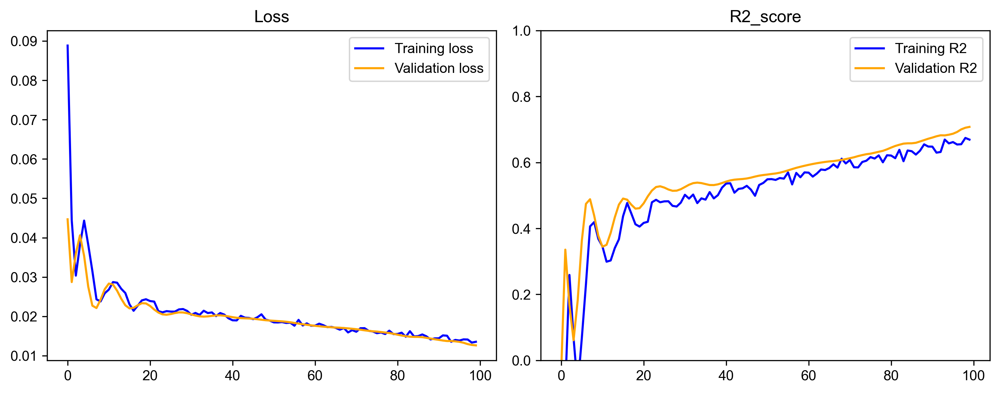

Training R2: 0.669
Validation R2: 0.708


In [41]:
# 训练结果可视化
fig = plt.figure(figsize=(10,4),dpi=300)   
# 损失函数
ax1 = plt.subplot(121)
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(np.arange(len(loss)), loss, 'b', label='Training loss')
plt.plot(np.arange(len(val_loss)), val_loss, 'orange', label='Validation loss')
plt.legend()
ax1.set_title('Loss')
# 决定系数，R2
ax2 = plt.subplot(122)
acc = history.history['rsq']
val_acc = history.history['val_rsq']
plt.plot(np.arange(len(acc)), acc, 'b', label='Training R2')
plt.plot(np.arange(len(val_acc)), val_acc, 'orange', label='Validation R2')
plt.legend()
ax2.set_title('R2_score')
# 只显示 R² 大于 0 的部分
plt.ylim(0, 1)  # 设置 y 轴范围
fig.tight_layout()    
plt.show()   

# 最终训练集和测试集上的 R2
print("Training R2: %.3f" % (history.history['rsq'][-1]))
print("Validation R2: %.3f" % (history.history['val_rsq'][-1]))

In [42]:
# 计算训练集、测试集上的y值，并将其 rescale
# train
yhat = model.predict(X_train)
y_train_hat = ScalerY.inverse_transform(yhat)
y_train_original = ScalerY.inverse_transform(y_train.reshape(-1,1))
r_squared_train = r2_score(y_train_original, y_train_hat)
# print(f"Train R²: {r_squared_train}")

# test
yhat = model.predict(X_test)
y_test_hat = ScalerY.inverse_transform(yhat)
y_test_original = ScalerY.inverse_transform(y_test.reshape(-1,1))
r_squared_train = r2_score(y_test_original, y_test_hat)
print(f"Test R²: {r_squared_train}")

Test R²: 0.7079306709916195


In [43]:
# **8. 评估模型**
y_pred = model.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(np.mean((y_test - y_pred) ** 2))

print(f"Test R²: {r2}")
print(f"Test RMSE: {rmse}")

Test R²: 0.7079306996509098
Test RMSE: 0.1123795127905557


In [54]:
X_test_1_final = X_test_s.copy()
X_test_1_final['Cooling_energy_pre (W/m²)'] =  ScalerY.inverse_transform(y_pred)
X_test_1_final['y_test'] = ScalerY.inverse_transform(y_test)
X_test_1_final['Cooling_energy_SQ (W/m²)'] = y_test_s
X_test_1_final

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1),Cooling_energy_pre (W/m²),y_test,Cooling_energy_SQ (W/m²)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-17 23:00:00,30.7,34.3,1.0,0,23,30.0,28.2,2.9,949.0,13.0,...,0.0,21.0,31.0,35.7,1.0,0.0,22.0,7.020847,6.630314,6.630314
2025-06-21 09:00:00,29.3,34.4,1.7,704,9,35.2,24.6,1.0,0.0,23.0,...,358.0,7.0,29.9,32.8,1.8,483.0,8.0,5.734178,4.720701,4.720701
2025-06-20 20:00:00,36.3,18.2,1.9,0,20,29.7,30.5,1.0,904.0,10.0,...,188.0,18.0,36.5,20.2,1.5,36.0,19.0,8.012349,7.318977,7.318977
2025-06-18 23:00:00,32.1,24.2,1.0,0,23,31.7,20.2,2.8,940.0,13.0,...,0.0,21.0,32.5,21.4,1.0,0.0,22.0,7.809103,6.948304,6.948304
2025-06-14 21:00:00,26.5,78.8,1.0,0,21,27.2,77.7,1.0,201.0,11.0,...,5.0,19.0,26.6,78.5,1.3,0.0,20.0,5.581316,6.405963,6.405963
2025-06-22 09:00:00,29.3,39.2,1.0,690,9,34.9,26.0,1.2,0.0,23.0,...,345.0,7.0,29.9,44.1,1.0,484.0,8.0,5.298405,4.288166,4.288166
2025-06-17 06:00:00,21.4,84.4,1.0,57,6,23.6,76.9,1.1,0.0,20.0,...,0.0,4.0,21.7,84.3,1.0,4.0,5.0,2.253728,2.002962,2.002962
2025-06-17 19:00:00,31.7,27.0,1.5,24,19,23.9,43.0,2.4,760.0,9.0,...,401.0,17.0,31.8,24.5,1.1,58.0,18.0,3.948417,3.239493,3.239493
2025-06-18 20:00:00,33.0,15.9,1.0,0,20,26.4,31.1,1.1,397.0,10.0,...,192.0,18.0,33.1,15.7,1.3,29.0,19.0,6.046302,3.535567,3.535567


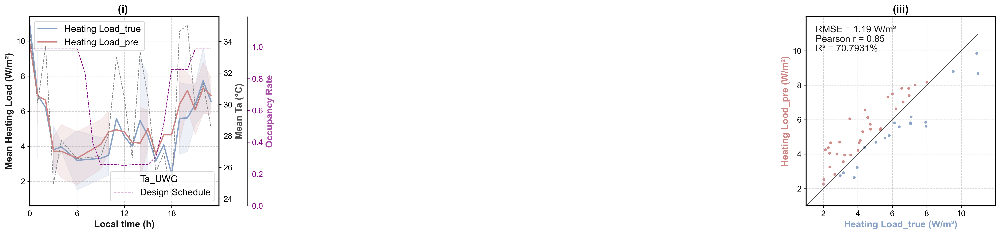

In [55]:
# 获取 Seaborn 中的色板
palettes = sns.color_palette("vlag", 4)

# 确保列名正确
# col_SQ_true = 'Heating_energy_SQ (W/m²)'
# col_UWG_pre = 'Heating_energy_pre (W/m²)'
col_SQ_true = 'Cooling_energy_SQ (W/m²)'
col_UWG_pre = 'Cooling_energy_pre (W/m²)'
col_UWG_pre_Ta = 'Shuanqing UWG Ta (°C)'

highrise_schedule = pd.Series(highrise_schedule_data, index=range(24))

# 计算 x 和 y 轴的范围
min_val = min(X_test_1_final[col_SQ_true].min(), X_test_1_final[col_UWG_pre].min())
max_val = max(X_test_1_final[col_SQ_true].max(), X_test_1_final[col_UWG_pre].max())

# 计算每日平均曲线
X_test_1_final['hour'] = pd.to_datetime(X_test_1_final.index).hour  
hourly_mean_SQ = X_test_1_final.groupby('hour')[col_SQ_true].mean()
hourly_std_SQ = X_test_1_final.groupby('hour')[col_SQ_true].std()
hourly_mean_UWG = X_test_1_final.groupby('hour')[col_UWG_pre].mean()
hourly_std_UWG = X_test_1_final.groupby('hour')[col_UWG_pre].std()
hourly_mean_UWG_Ta = X_test_1_final.groupby('hour')[col_UWG_pre_Ta].mean()

# 设置图像尺寸
fig = plt.figure(figsize=(21, 5), dpi=300)
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 2.5, 1], height_ratios=[1])  # 设置子图宽度比例

# ========== 子图 1：每日平均曲线 + 置信区间 ==========
ax1 = plt.subplot(gs[0])
ax1.plot(hourly_mean_SQ.index, hourly_mean_SQ, label='Heating Load_true',color=palettes[0], linestyle='-', linewidth=2)
ax1.fill_between(hourly_mean_SQ.index, hourly_mean_SQ - hourly_std_SQ, hourly_mean_SQ + hourly_std_SQ,color=palettes[0], alpha=0.15)
ax1.plot(hourly_mean_UWG.index, hourly_mean_UWG, label='Heating Load_pre',color=palettes[3], linestyle='-', linewidth=2)
ax1.fill_between(hourly_mean_UWG.index, hourly_mean_UWG - hourly_std_UWG, hourly_mean_UWG + hourly_std_UWG,color=palettes[3], alpha=0.15)
# 创建第二个 y 轴
ax1_b = ax1.twinx()
ax1_b.plot(hourly_mean_UWG_Ta.index, hourly_mean_UWG_Ta, label='Ta_UWG',color='gray', linestyle='--', linewidth=1)
ax1_b.set_ylabel('Mean Ta (°C)', fontsize=14, fontweight='bold',alpha = 0.7)
ax1_b.tick_params(axis='y', labelsize=12)
# 创建第二个 y 轴

# 第三个 Y 轴
ax1_c = ax1.twinx()
ax1_c.spines["right"].set_position(("axes", 1.15))  # 右移第三个 y 轴
ax1_c.plot(highrise_schedule.index, highrise_schedule, label='Design Schedule', color='purple', linestyle='--', linewidth=1)
ax1_c.set_ylabel('Occupancy Rate', fontsize=14, fontweight='bold', alpha=0.7, color='purple')
ax1_c.tick_params(axis='y', labelsize=12, colors='purple')
ax1_c.set_ylim(0, 1.19)
# ax1_c.legend(fontsize=12, loc='lower right')
# 第三个 Y 轴

ax1.set_xlabel('Local time (h)', fontsize=14, fontweight='bold',alpha = 0.9)
ax1.set_ylabel(f'Mean Heating Load (W/m²)', fontsize=14, fontweight='bold',alpha = 0.9)
ax1.set_xticks(range(0, 24, 6))
ax1.tick_params(axis='both', labelsize=12)  # 设置刻度字体大小
ax1.grid(True, linestyle='--', alpha=0.6)
handles1, labels1 = ax1_b.get_legend_handles_labels()
handles2, labels2 = ax1_c.get_legend_handles_labels()
ax1_b.legend(handles1 + handles2, labels1 + labels2, fontsize=14, loc='lower right')
ax1.legend(fontsize=14, loc='upper left')
# ax1_b.legend(fontsize=12, loc='lower right')
ax1.set_xlim(0, 24)
ax1.set_title('(i) ', fontsize=16, fontweight='bold') # Average diurnal cycle (lines) ± 1 standard deviation (shaded area)
for spine in ax1.spines.values():
    spine.set_linewidth(1.5)
    spine.set_color('black')

# # ========== 子图 2：时间序列比较 & 计算 Bias ==========【y_test 随机抽样 时间会乱】
# ax2 = plt.subplot(gs[1])
# ax2.plot(X_test_1_final.index, X_test_1_final[col_SQ_true], color=palettes[0], label='Heating Load_true', linestyle='-', linewidth=2)
# ax2.plot(X_test_1_final.index, X_test_1_final[col_UWG_pre], color=palettes[3], label='Heating Load_pre', linestyle='-', linewidth=2)
# # 创建第二个 y 轴
# ax2_b = ax2.twinx()
# ax2_b.plot(X_test_1_final.index, X_test_1_final[col_UWG_pre_Ta],color='gray', linestyle='--', linewidth=1, label='Ta_UWG')
# ax2_b.set_ylabel('Ta (°C)', fontsize=14, fontweight='bold',alpha = 0.7)
# ax2_b.tick_params(axis='y', labelsize=12)
# # 创建第二个 y 轴

# ax2.xaxis.set_major_locator(mdates.DayLocator(interval=8))  
# ax2.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 48]))  
# ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))  # 仅显示月-日

# ax2.set_xlabel('Time (grid interval = 2d)', fontsize=14, fontweight='bold',alpha = 0.9)
# ax2.set_ylabel(f'Heating Load (W/m²)', fontsize=14, fontweight='bold',alpha = 0.9)
# ax2.tick_params(axis='both', labelsize=12)  # 设置刻度字体大小
# ax2.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.7)  # 细网格线
# ax2.grid(which='major', linestyle='-', linewidth=0.8, alpha=1)  # 主要网格线
# # xticks = ax2.get_xticks()  # 获取当前 x 轴刻度
# # ax2.set_xticks(xticks[:-1])  # 移除最后一个刻度
# # handles1, labels1 = ax2.get_legend_handles_labels()
# # handles2, labels2 = ax2_b.get_legend_handles_labels()
# # ax2.legend(handles1 + handles2, labels1 + labels2, fontsize=12, loc='upper left')
# ax2.legend(fontsize=12, loc='upper left')
# ax2_b.legend(fontsize=12, loc='lower right')
# ax2.set_title('(ii)', fontsize=16, fontweight='bold')
# for spine in ax2.spines.values():
#     spine.set_linewidth(1.5)
#     spine.set_color('black')

# ========== 子图 3：散点图 & 计算 RMSE 和 R² ==========
ax3 = plt.subplot(gs[2])
colors = np.array([palettes[0] if true > pre else palettes[-1] for true, pre in zip(X_test_1_final[col_SQ_true], X_test_1_final[col_UWG_pre])])
ax3.scatter(X_test_1_final[col_SQ_true], X_test_1_final[col_UWG_pre], color=colors, s=10, alpha=0.9)
ax3.set_xlim(min_val-1, max_val+1)
ax3.set_ylim(min_val-1, max_val+1)
rmse_uwg = np.sqrt(mean_squared_error(X_test_1_final[col_SQ_true], X_test_1_final[col_UWG_pre]))
pearson_uwg, p_value_uwg = pearsonr(X_test_1_final[col_SQ_true], X_test_1_final[col_UWG_pre])
r2_uwg = r2_score(X_test_1_final[col_SQ_true], X_test_1_final[col_UWG_pre])
ax3.set_xlabel('Heating Load_true (W/m²)', fontsize=14, fontweight='bold',alpha = 1, color=palettes[0])
ax3.set_ylabel('Heating Lood_pre (W/m²)', fontsize=14, fontweight='bold',alpha = 1, color=palettes[-1])
ax3.tick_params(axis='both', labelsize=12)  # 设置刻度字体大小
ax3.grid(True, linestyle='--', alpha=0.6)
ax3.plot([0, max_val], [0, max_val], color='k', linestyle='-',linewidth=0.5,alpha = 0.8)
ax3.set_title('(iii)', fontsize=16, fontweight='bold')

ax3.text(0.05, 0.93, f'RMSE = {rmse_uwg:.2f} W/m²', fontsize=14,ha='left', va='center', transform=ax3.transAxes,  alpha=0.9)
ax3.text(0.05, 0.88, f'Pearson r = {pearson_uwg:.2f}', fontsize=14,ha='left', va='center', transform=ax3.transAxes,alpha=0.9)
ax3.text(0.05, 0.83, f'R² = {r2_uwg*100:.4f}%', fontsize=14,ha='left', va='center', transform=ax3.transAxes, alpha=0.9)
for spine in ax3.spines.values():
    spine.set_linewidth(1.5)
    spine.set_color('black')

plt.tight_layout()
plt.show()

In [56]:
X_train.shape

(203, 11, 5)

In [57]:
X_test.shape

(51, 11, 5)

In [58]:
train_reframed.columns

Index(['Cooling_energy_SQ (W/m²)', 'Shuanqing UWG Ta (°C)',
       'Shuanqing UWG RH (%)', 'Shuanqing UWG WS (m/s)',
       'Shuanqing UWG Rad (W/m²)', 'Local time',
       'Cooling_energy_SQ (W/m²)(t-10)', 'Shuanqing UWG Ta (°C)(t-10)',
       'Shuanqing UWG RH (%)(t-10)', 'Shuanqing UWG WS (m/s)(t-10)',
       'Shuanqing UWG Rad (W/m²)(t-10)', 'Local time(t-10)',
       'Cooling_energy_SQ (W/m²)(t-9)', 'Shuanqing UWG Ta (°C)(t-9)',
       'Shuanqing UWG RH (%)(t-9)', 'Shuanqing UWG WS (m/s)(t-9)',
       'Shuanqing UWG Rad (W/m²)(t-9)', 'Local time(t-9)',
       'Cooling_energy_SQ (W/m²)(t-8)', 'Shuanqing UWG Ta (°C)(t-8)',
       'Shuanqing UWG RH (%)(t-8)', 'Shuanqing UWG WS (m/s)(t-8)',
       'Shuanqing UWG Rad (W/m²)(t-8)', 'Local time(t-8)',
       'Cooling_energy_SQ (W/m²)(t-7)', 'Shuanqing UWG Ta (°C)(t-7)',
       'Shuanqing UWG RH (%)(t-7)', 'Shuanqing UWG WS (m/s)(t-7)',
       'Shuanqing UWG Rad (W/m²)(t-7)', 'Local time(t-7)',
       'Cooling_energy_SQ (W/m²)(t-6)', 'Shu

### SHAP解释LSTM模型

In [59]:
# X_train 是 base data，具体取多少数据可以调整，数据越多，计算量越大
explainer = shap.DeepExplainer(model, X_train)
# X_test 用多少数据也可以修改，数据用得越多，计算量越大
shap_obj = explainer(X_train_reframed)

In [60]:
# 因为LSTM的输入数据是三维的，因此解释产生的shap_values也是三维，两个数据的维度一样。
# 但是SHAP的可视化API需要shap_values是二维的，这里我们将三维数据reshape成二维数据即可。
# reshape的时候，记得输入数据和shap_values数据的变量名称要对得上。

# shap_values
temp = np.squeeze(shap_obj.values, axis = 3)
shap_obj.values = temp.reshape(temp.shape[0], temp.shape[1]*temp.shape[2])

# observed data
temp = shap_obj.data
shap_obj.data = temp.reshape(temp.shape[0], temp.shape[1]*temp.shape[2])

# feature names
shap_obj.feature_names = X_train_reframed_s.columns.tolist()

# base_values
yhat = model.predict(X_train)
base_value = np.mean(yhat)
shap_obj.base_values = np.full(len(shap_obj.data), base_value)

In [61]:
shap_obj.values.shape

(254, 55)

In [62]:
shap_obj.values

array([[-0.00486088, -0.00613904,  0.00107318, ..., -0.00324118,
        -0.00232449, -0.01215232],
       [-0.00577823, -0.00636794,  0.00131633, ..., -0.00320298,
        -0.0024117 , -0.00743248],
       [-0.00646318, -0.00633701,  0.00130384, ..., -0.00409432,
        -0.00126145, -0.00268492],
       ...,
       [-0.00813114, -0.00369462,  0.00122381, ..., -0.0038604 ,
        -0.00184307,  0.04115454],
       [-0.00835032, -0.00403669,  0.00118178, ..., -0.00390628,
        -0.00169483,  0.04670208],
       [-0.00843966, -0.00393237,  0.00114213, ..., -0.00393729,
        -0.001553  ,  0.05231812]])

In [63]:
shap_obj.data

array([[0.41772152, 0.87638889, 0.03333333, ..., 0.03703704, 0.07050645,
        0.39130435],
       [0.38607595, 0.90833333, 0.        , ..., 0.03703704, 0.04568024,
        0.43478261],
       [0.36075949, 0.91944444, 0.        , ..., 0.        , 0.19960278,
        0.47826087],
       ...,
       [0.28481013, 0.74305556, 0.        , ..., 0.        , 0.        ,
        0.86956522],
       [0.2721519 , 0.79166667, 0.        , ..., 0.        , 0.        ,
        0.91304348],
       [0.26582278, 0.7875    , 0.        , ..., 0.        , 0.        ,
        0.95652174]])

In [64]:
X_train_reframed_s

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Ta (°C)(t-2),Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-14 10:00:00,27.7,75.4,1.1,46,10,30.4,60.7,1.0,0.0,0.0,...,28.3,73.4,1.0,28.0,8.0,27.9,74.7,1.1,71.0,9.0
2025-06-14 11:00:00,27.2,77.7,1.0,201,11,30.1,62.7,1.0,0.0,1.0,...,27.9,74.7,1.1,71.0,9.0,27.7,75.4,1.1,46.0,10.0
2025-06-14 12:00:00,26.8,78.5,1.0,233,12,29.8,64.8,1.0,0.0,2.0,...,27.7,75.4,1.1,46.0,10.0,27.2,77.7,1.0,201.0,11.0
2025-06-14 13:00:00,26.6,81.7,1.1,215,13,29.6,66.0,1.0,0.0,3.0,...,27.2,77.7,1.0,201.0,11.0,26.8,78.5,1.0,233.0,12.0
2025-06-14 14:00:00,26.7,80.1,1.4,98,14,29.4,67.6,1.0,0.0,4.0,...,26.8,78.5,1.0,233.0,12.0,26.6,81.7,1.1,215.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-24 19:00:00,25.9,61.6,1.0,14,19,23.0,69.0,1.0,425.0,9.0,...,26.0,63.0,1.0,83.0,17.0,25.9,62.2,1.0,30.0,18.0
2025-06-24 20:00:00,25.8,65.9,1.0,0,20,24.0,64.7,1.0,436.0,10.0,...,25.9,62.2,1.0,30.0,18.0,25.9,61.6,1.0,14.0,19.0
2025-06-24 21:00:00,25.6,65.8,1.0,0,21,24.6,65.3,1.0,256.0,11.0,...,25.9,61.6,1.0,14.0,19.0,25.8,65.9,1.0,0.0,20.0


In [65]:
X_train_1_data_origin = ScalerX.inverse_transform(shap_obj.data)
X_train_1_data = pd.DataFrame(X_train_1_data_origin, columns=X_train_reframed_s.columns,index=X_train_reframed_s.index)
X_train_1_data

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Ta (°C)(t-2),Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-14 10:00:00,27.7,75.4,1.1,46.0,10.0,30.4,60.7,1.0,0.0,0.0,...,28.3,73.4,1.0,28.0,8.0,27.9,74.7,1.1,71.0,9.0
2025-06-14 11:00:00,27.2,77.7,1.0,201.0,11.0,30.1,62.7,1.0,0.0,1.0,...,27.9,74.7,1.1,71.0,9.0,27.7,75.4,1.1,46.0,10.0
2025-06-14 12:00:00,26.8,78.5,1.0,233.0,12.0,29.8,64.8,1.0,0.0,2.0,...,27.7,75.4,1.1,46.0,10.0,27.2,77.7,1.0,201.0,11.0
2025-06-14 13:00:00,26.6,81.7,1.1,215.0,13.0,29.6,66.0,1.0,0.0,3.0,...,27.2,77.7,1.0,201.0,11.0,26.8,78.5,1.0,233.0,12.0
2025-06-14 14:00:00,26.7,80.1,1.4,98.0,14.0,29.4,67.6,1.0,0.0,4.0,...,26.8,78.5,1.0,233.0,12.0,26.6,81.7,1.1,215.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-24 19:00:00,25.9,61.6,1.0,14.0,19.0,23.0,69.0,1.0,425.0,9.0,...,26.0,63.0,1.0,83.0,17.0,25.9,62.2,1.0,30.0,18.0
2025-06-24 20:00:00,25.8,65.9,1.0,0.0,20.0,24.0,64.7,1.0,436.0,10.0,...,25.9,62.2,1.0,30.0,18.0,25.9,61.6,1.0,14.0,19.0
2025-06-24 21:00:00,25.6,65.8,1.0,0.0,21.0,24.6,65.3,1.0,256.0,11.0,...,25.9,61.6,1.0,14.0,19.0,25.8,65.9,1.0,0.0,20.0


In [66]:
# 导出SHAP的value和data
X_train_1_shap = pd.DataFrame(shap_obj.values, columns=X_train_reframed_s.columns,index=X_train_reframed_s.index)
X_train_1_shap

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Ta (°C)(t-2),Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-14 10:00:00,-0.004861,-0.006139,0.001073,-0.002268,0.001385,0.000696,-0.003734,0.001008,-0.001313,0.010821,...,-0.003142,-0.000917,-0.003288,0.002265,-0.015174,-0.003533,0.000219,-0.003241,-0.002324,-0.012152
2025-06-14 11:00:00,-0.005778,-0.006368,0.001316,-0.000320,0.000345,0.000059,-0.003956,0.000993,-0.001116,0.009702,...,-0.003879,-0.000746,-0.002470,0.001886,-0.010950,-0.003913,0.000402,-0.003203,-0.002412,-0.007432
2025-06-14 12:00:00,-0.006463,-0.006337,0.001304,0.000048,-0.000660,-0.000563,-0.004177,0.000975,-0.001014,0.008702,...,-0.004230,-0.000584,-0.002448,0.002338,-0.006668,-0.004862,0.000609,-0.004094,-0.001261,-0.002685
2025-06-14 13:00:00,-0.006747,-0.006644,0.001048,-0.000154,-0.001649,-0.000968,-0.004240,0.000963,-0.000930,0.007747,...,-0.005122,-0.000354,-0.003164,0.000230,-0.002340,-0.005615,0.000800,-0.004018,-0.001018,0.002073
2025-06-14 14:00:00,-0.006460,-0.006221,0.000322,-0.001428,-0.002640,-0.001357,-0.004351,0.000944,-0.000892,0.006855,...,-0.005804,-0.000121,-0.003110,-0.000219,0.002029,-0.005965,0.001096,-0.003036,-0.001134,0.006839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-24 19:00:00,-0.007857,-0.003289,0.001319,-0.001014,-0.006773,-0.013667,-0.004099,0.001022,0.000692,0.002211,...,-0.007301,0.000144,-0.002945,0.002630,0.023805,-0.007300,0.000837,-0.003707,-0.002028,0.030270
2025-06-24 20:00:00,-0.007938,-0.003798,0.001275,-0.001308,-0.007820,-0.011600,-0.003515,0.000963,0.000871,0.001510,...,-0.007430,0.000218,-0.003105,0.003765,0.028795,-0.007260,0.000931,-0.003797,-0.001958,0.035632
2025-06-24 21:00:00,-0.008131,-0.003695,0.001224,-0.001537,-0.008877,-0.010248,-0.003497,0.000888,0.000736,0.000765,...,-0.007340,0.000308,-0.003248,0.004232,0.033980,-0.007366,0.001475,-0.003860,-0.001843,0.041155


In [67]:
# 绝对值化
X_train_1_shap_abs = X_train_1_shap.abs()
X_train_1_shap_abs

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time,Shuanqing UWG Ta (°C)(t-10),Shuanqing UWG RH (%)(t-10),Shuanqing UWG WS (m/s)(t-10),Shuanqing UWG Rad (W/m²)(t-10),Local time(t-10),...,Shuanqing UWG Ta (°C)(t-2),Shuanqing UWG RH (%)(t-2),Shuanqing UWG WS (m/s)(t-2),Shuanqing UWG Rad (W/m²)(t-2),Local time(t-2),Shuanqing UWG Ta (°C)(t-1),Shuanqing UWG RH (%)(t-1),Shuanqing UWG WS (m/s)(t-1),Shuanqing UWG Rad (W/m²)(t-1),Local time(t-1)
Date,,,,,,,,,,,,,,,,,,,,,
2025-06-14 10:00:00,0.004861,0.006139,0.001073,0.002268,0.001385,0.000696,0.003734,0.001008,0.001313,0.010821,...,0.003142,0.000917,0.003288,0.002265,0.015174,0.003533,0.000219,0.003241,0.002324,0.012152
2025-06-14 11:00:00,0.005778,0.006368,0.001316,0.000320,0.000345,0.000059,0.003956,0.000993,0.001116,0.009702,...,0.003879,0.000746,0.002470,0.001886,0.010950,0.003913,0.000402,0.003203,0.002412,0.007432
2025-06-14 12:00:00,0.006463,0.006337,0.001304,0.000048,0.000660,0.000563,0.004177,0.000975,0.001014,0.008702,...,0.004230,0.000584,0.002448,0.002338,0.006668,0.004862,0.000609,0.004094,0.001261,0.002685
2025-06-14 13:00:00,0.006747,0.006644,0.001048,0.000154,0.001649,0.000968,0.004240,0.000963,0.000930,0.007747,...,0.005122,0.000354,0.003164,0.000230,0.002340,0.005615,0.000800,0.004018,0.001018,0.002073
2025-06-14 14:00:00,0.006460,0.006221,0.000322,0.001428,0.002640,0.001357,0.004351,0.000944,0.000892,0.006855,...,0.005804,0.000121,0.003110,0.000219,0.002029,0.005965,0.001096,0.003036,0.001134,0.006839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-24 19:00:00,0.007857,0.003289,0.001319,0.001014,0.006773,0.013667,0.004099,0.001022,0.000692,0.002211,...,0.007301,0.000144,0.002945,0.002630,0.023805,0.007300,0.000837,0.003707,0.002028,0.030270
2025-06-24 20:00:00,0.007938,0.003798,0.001275,0.001308,0.007820,0.011600,0.003515,0.000963,0.000871,0.001510,...,0.007430,0.000218,0.003105,0.003765,0.028795,0.007260,0.000931,0.003797,0.001958,0.035632
2025-06-24 21:00:00,0.008131,0.003695,0.001224,0.001537,0.008877,0.010248,0.003497,0.000888,0.000736,0.000765,...,0.007340,0.000308,0.003248,0.004232,0.033980,0.007366,0.001475,0.003860,0.001843,0.041155


In [68]:
# 目标列名
target_cols = ["Shuanqing UWG Ta (°C)", "Shuanqing UWG RH (%)", 
               "Shuanqing UWG WS (m/s)", "Shuanqing UWG Rad (W/m²)",
               'Local time'
              ]

# 遍历目标列
for col in target_cols:
    # 找到所有包含该字段的列
    matching_cols = [c for c in X_train_1_shap_abs.columns if col in c]   
    # 计算这些列的总和，并存入新列
    X_train_1_shap_abs[col] = X_train_1_shap_abs[matching_cols].sum(axis=1)
    

df_shap = X_train_1_shap_abs[target_cols]
df_shap

,Shuanqing UWG Ta (°C),Shuanqing UWG RH (%),Shuanqing UWG WS (m/s),Shuanqing UWG Rad (W/m²),Local time
Date,,,,,
2025-06-14 10:00:00,0.023685,0.037807,0.017298,0.039845,0.099223
2025-06-14 11:00:00,0.028819,0.038284,0.016669,0.038526,0.079033
2025-06-14 12:00:00,0.035251,0.038296,0.016799,0.037125,0.060092
2025-06-14 13:00:00,0.041413,0.038191,0.016566,0.035000,0.045725
2025-06-14 14:00:00,0.046747,0.037214,0.014987,0.033032,0.040697
...,...,...,...,...,...
2025-06-24 19:00:00,0.110240,0.025517,0.016372,0.016584,0.094945
2025-06-24 20:00:00,0.103463,0.025041,0.017187,0.024487,0.115321
2025-06-24 21:00:00,0.098401,0.024640,0.017998,0.032038,0.136408


In [69]:
df_true = train_reframed_s[train_reframed_s.columns[0]]
df_true = df_true.to_frame()
df_true.values
df_true.index

DatetimeIndex(['2025-06-14 10:00:00', '2025-06-14 11:00:00',
               '2025-06-14 12:00:00', '2025-06-14 13:00:00',
               '2025-06-14 14:00:00', '2025-06-14 15:00:00',
               '2025-06-14 16:00:00', '2025-06-14 17:00:00',
               '2025-06-14 18:00:00', '2025-06-14 19:00:00',
               ...
               '2025-06-24 14:00:00', '2025-06-24 15:00:00',
               '2025-06-24 16:00:00', '2025-06-24 17:00:00',
               '2025-06-24 18:00:00', '2025-06-24 19:00:00',
               '2025-06-24 20:00:00', '2025-06-24 21:00:00',
               '2025-06-24 22:00:00', '2025-06-24 23:00:00'],
              dtype='datetime64[ns]', name='Date', length=254, freq=None)

In [70]:
df_data = X_train_1_data[target_cols]
target_cols_1 = ['Ta (°C)', 'RH (%)', 'WS (m/s)', 'Rad (W/m²)',
                'Local time'
                ]
df_data.columns = target_cols_1
df_data

,Ta (°C),RH (%),WS (m/s),Rad (W/m²),Local time
Date,,,,,
2025-06-14 10:00:00,27.7,75.4,1.1,46.0,10.0
2025-06-14 11:00:00,27.2,77.7,1.0,201.0,11.0
2025-06-14 12:00:00,26.8,78.5,1.0,233.0,12.0
2025-06-14 13:00:00,26.6,81.7,1.1,215.0,13.0
2025-06-14 14:00:00,26.7,80.1,1.4,98.0,14.0
...,...,...,...,...,...
2025-06-24 19:00:00,25.9,61.6,1.0,14.0,19.0
2025-06-24 20:00:00,25.8,65.9,1.0,0.0,20.0
2025-06-24 21:00:00,25.6,65.8,1.0,0.0,21.0


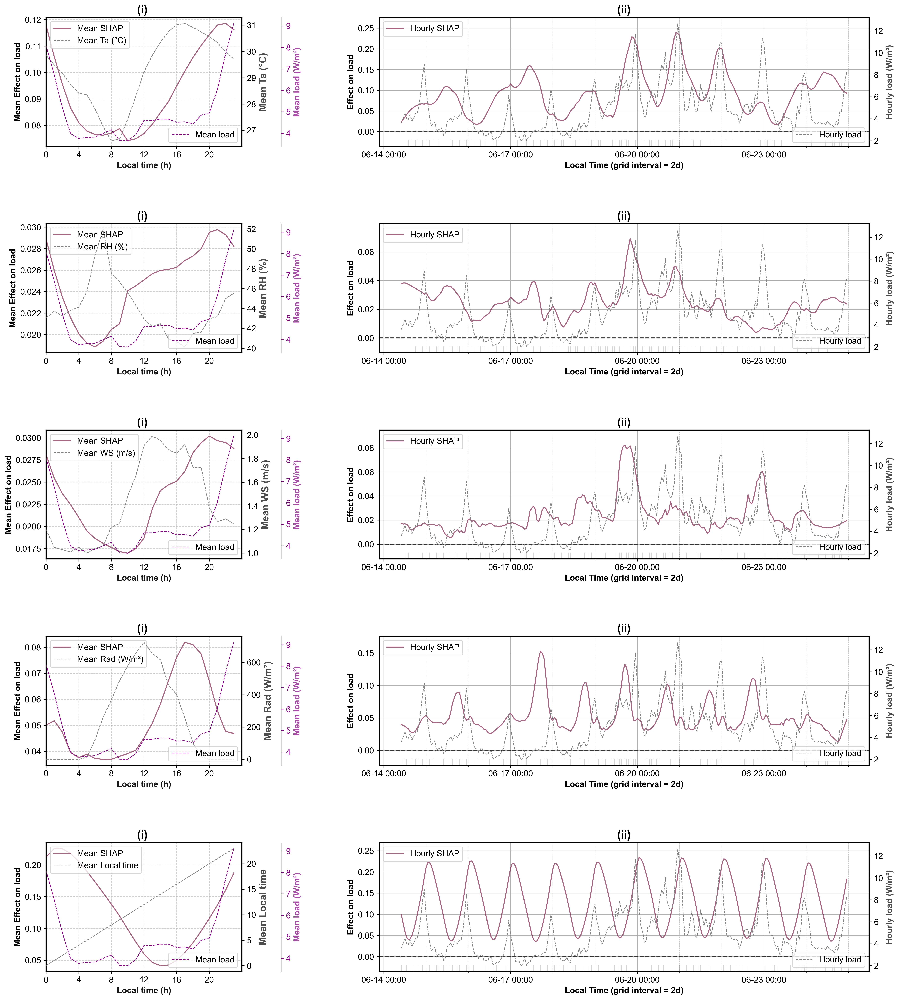

In [71]:
# 假设 df.index 是时间索引
df_shap['hour'] = df_shap.index.hour  # 提取小时信息
df_data['hour'] = df_data.index.hour  # 提取小时信息
df_true['hour'] = df_true.index.hour  # 提取小时信息

# 创建一个包含特征名称的列表
feature_names_shap = target_cols
feature_names_value = target_cols_1

# 设置子图的行和列数
num_features = len(feature_names_shap)
num_cols = 2  # 两列
num_rows = num_features  # 每个特征占据一行

# 创建图形和 GridSpec 对象
fig = plt.figure(figsize=(18, num_rows * 4), dpi=300)
gs = GridSpec(num_rows, num_cols, width_ratios=[1, 2.5], figure=fig)  # 左列小，右列大

# 对特征进行循环
for feature_index in range(num_features):
    # 提取特征数据
    x_values = df_shap.index
    y_values = df_shap.iloc[:, feature_index]
    
    x_values_true = df_true.index
    y_values_true = df_true['Cooling_energy_SQ (W/m²)'].values
#     y_values_true = df_true['Heating_energy_SQ (W/m²)'].values
    
    # 计算每日 24 小时均值
    shap_cycle = df_shap.groupby('hour').mean(numeric_only=True)[feature_names_shap[feature_index]]
    value_cycle = df_data.groupby('hour').mean(numeric_only=True)[feature_names_value[feature_index]]
    true_cycle = df_true.groupby('hour').mean(numeric_only=True)

    # ====== 左侧子图（每日 24 小时周期图）======
    ax1 = fig.add_subplot(gs[feature_index, 0])  # 左列子图
    ax1.plot(shap_cycle.index, shap_cycle.values, label='Mean SHAP', color='#7d264e', alpha=0.7, linewidth=1.5)
    
    # 创建第二个 y 轴
    ax1_b = ax1.twinx()
    ax1_b.plot(value_cycle.index, value_cycle.values, label=f'Mean {feature_names_value[feature_index]}',
               color='gray', linestyle='--', linewidth=1)
    ax1_b.set_ylabel(f'Mean {feature_names_value[feature_index]}', fontsize=14, fontweight='bold',alpha = 0.7)
    ax1_b.tick_params(axis='y', labelsize=12)
    # 创建第二个 y 轴
    
    # 第三个 Y 轴
    ax1_c = ax1.twinx()
    ax1_c.spines["right"].set_position(("axes", 1.2))  # 右移第三个 y 轴
    ax1_c.plot(true_cycle.index, true_cycle.values, label='Mean load', color='purple', linestyle='--', linewidth=1)
    ax1_c.set_ylabel('Mean load (W/m²)', fontsize=12, fontweight='bold', alpha=0.7, color='purple')
    ax1_c.tick_params(axis='y', labelsize=12, colors='purple')
    # 第三个 Y 轴

    # 仅为左列子图设置 ylabel
    ax1.set_xlabel('Local time (h)', fontsize=12, fontweight='bold',alpha = 0.9)
    ax1.set_ylabel('Mean Effect on load', fontname='Arial', fontsize=12, fontweight='bold')


    # 设置 x 轴为 0-23 小时
    ax1.set_xticks(range(0, 24, 4))  # 每 3 小时一个刻度

    ax1.grid(True, linestyle='--', alpha=0.6)

    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax1_b.get_legend_handles_labels()
    ax1.legend(handles1 + handles2, labels1 + labels2, fontsize=12, loc='upper left')
    ax1_c.legend(fontsize=12, loc='lower right')
    
    ax1.set_xlim(0, 24)
    ax1.set_title('(i) ', fontsize=16, fontweight='bold')
    
    # 添加黑色边框
    for spine in ax1.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.5)

    # ====== 右侧子图（原始时间序列图）======
    ax2 = fig.add_subplot(gs[feature_index, 1])  # 右列子图
    ax2.plot(x_values, y_values, label='Hourly SHAP', color='#7d264e', alpha=0.7, linewidth=1.5)
    
    # 添加 y=0 处的粗虚线
    ax2.axhline(y=0, color='k', linestyle='--', linewidth=1.5, alpha=0.7)

    # 添加轴须图（随机抽样 1/2）
    sample_indices = np.random.choice(len(x_values), size=len(x_values) // 2, replace=False)
    sampled_x_values = x_values[sample_indices]
    sns.rugplot(x=sampled_x_values, ax=ax2, color='black', alpha=0.8, linewidth=0.1, height=0.05)
    
    # 创建第二个 y 轴
    ax2_b = ax2.twinx()
    ax2_b.plot(x_values_true,y_values_true, color='gray', linestyle='--', linewidth=1, label='Hourly load')
    ax2_b.set_ylabel('Hourly load (W/m²)', fontsize=12, fontweight='bold', alpha=0.7)
    ax2_b.tick_params(axis='y', labelsize=12)
    # 创建第二个 y 轴
    
    # 设置 x 轴时间格式
    ax2.xaxis.set_major_locator(mdates.DayLocator(interval=3))  
    ax2.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 48]))  
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
    
    ax2.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.7)  
    ax2.grid(which='major', linestyle='-', linewidth=0.8, alpha=1)

    # 仅为右列子图设置 xlabel
    ax2.set_xlabel('Local Time (grid interval = 2d)', fontname='Arial', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Effect on load', fontname='Arial', fontsize=12, fontweight='bold')
    
    ax2.legend(fontsize=12, loc='upper left')
    ax2_b.legend(fontsize=12, loc='lower right')
    ax2.set_title('(ii)', fontsize=16, fontweight='bold')
    
    # 添加黑框
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.5)

        
    # 设置刻度字体
    ax1.tick_params(axis='both', labelsize=12)
    ax2.tick_params(axis='both', labelsize=12)

    for label in ax1.get_xticklabels() + ax1.get_yticklabels() + ax2.get_xticklabels() + ax2.get_yticklabels():
        label.set_fontname('Arial')

# 调整子图间距
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.6)
plt.show()

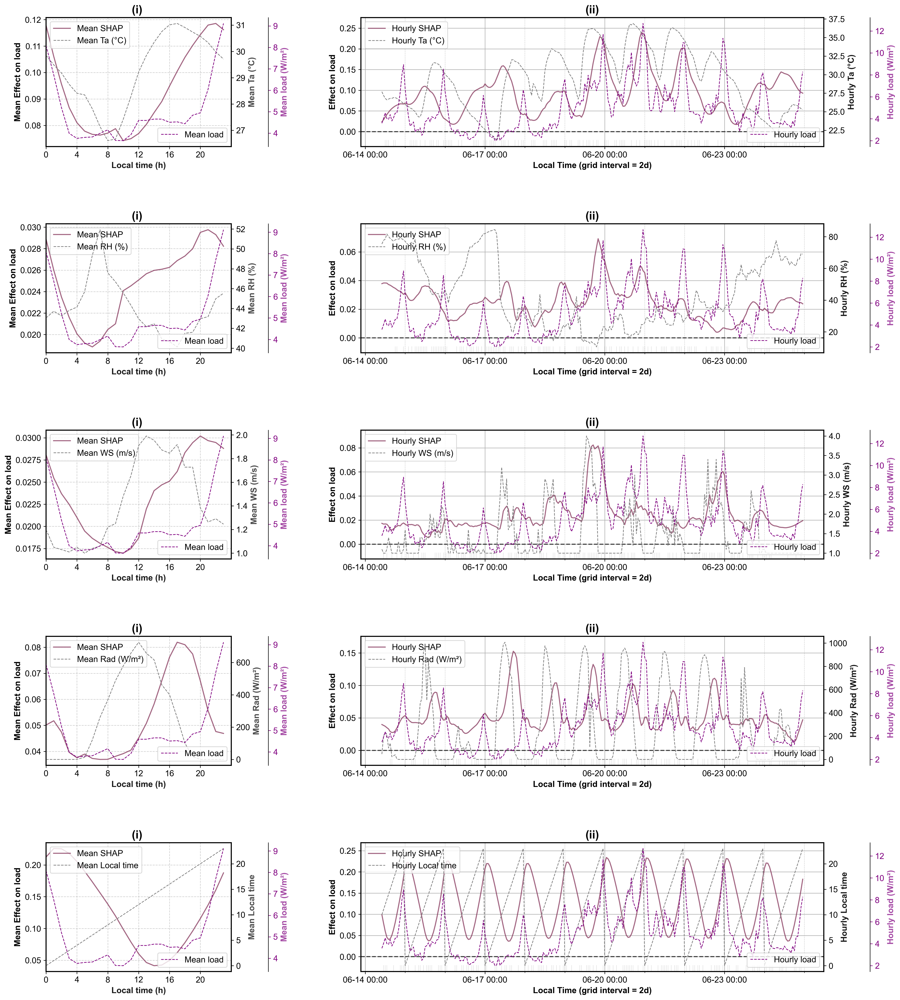

In [72]:
# 假设 df.index 是时间索引
df_shap['hour'] = df_shap.index.hour  # 提取小时信息
df_data['hour'] = df_data.index.hour  # 提取小时信息
df_true['hour'] = df_true.index.hour  # 提取小时信息

# 创建一个包含特征名称的列表
feature_names_shap = target_cols
feature_names_value = target_cols_1

# 设置子图的行和列数
num_features = len(feature_names_shap)
num_features_value = len(feature_names_value)
num_cols = 2  # 两列
num_rows = num_features  # 每个特征占据一行

# 创建图形和 GridSpec 对象
fig = plt.figure(figsize=(18, num_rows * 4), dpi=300)
gs = GridSpec(num_rows, num_cols, width_ratios=[1, 2.5], figure=fig)  # 左列小，右列大

# 对特征进行循环
for feature_index in range(num_features):
    # 提取特征数据
    x_values = df_shap.index
    y_values = df_shap.iloc[:, feature_index]
    
    x_values_true = df_true.index
    y_values_true = df_true['Cooling_energy_SQ (W/m²)'].values
#     y_values_true = df_true['Heating_energy_SQ (W/m²)'].values

    x_values_data = df_data.index
    y_values_data = df_data.iloc[:, feature_index]
    
    # 计算每日 24 小时均值
    shap_cycle = df_shap.groupby('hour').mean(numeric_only=True)[feature_names_shap[feature_index]]
    value_cycle = df_data.groupby('hour').mean(numeric_only=True)[feature_names_value[feature_index]]
    true_cycle = df_true.groupby('hour').mean(numeric_only=True)

    # ====== 左侧子图（每日 24 小时周期图）======
    ax1 = fig.add_subplot(gs[feature_index, 0])  # 左列子图
    ax1.plot(shap_cycle.index, shap_cycle.values, label='Mean SHAP', color='#7d264e', alpha=0.7, linewidth=1.5)
    
    # 创建第二个 y 轴
    ax1_b = ax1.twinx()
    ax1_b.plot(value_cycle.index, value_cycle.values, label=f'Mean {feature_names_value[feature_index]}',
               color='gray', linestyle='--', linewidth=1)
    ax1_b.set_ylabel(f'Mean {feature_names_value[feature_index]}', fontsize=12, fontweight='bold',alpha = 0.7)
    ax1_b.tick_params(axis='y', labelsize=12)
    # 创建第二个 y 轴
    
    # 第三个 Y 轴
    ax1_c = ax1.twinx()
    ax1_c.spines["right"].set_position(("axes", 1.2))  # 右移第三个 y 轴
    ax1_c.plot(true_cycle.index, true_cycle.values, label='Mean load', color='purple', linestyle='--', linewidth=1)
    ax1_c.set_ylabel('Mean load (W/m²)', fontsize=12, fontweight='bold', alpha=0.7, color='purple')
    ax1_c.tick_params(axis='y', labelsize=12, colors='purple')
    # 第三个 Y 轴

    # 仅为左列子图设置 ylabel
    ax1.set_xlabel('Local time (h)', fontsize=12, fontweight='bold',alpha = 0.9)
    ax1.set_ylabel('Mean Effect on load', fontname='Arial', fontsize=12, fontweight='bold')


    # 设置 x 轴为 0-23 小时
    ax1.set_xticks(range(0, 24, 4))  # 每 3 小时一个刻度

    ax1.grid(True, linestyle='--', alpha=0.6)

    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax1_b.get_legend_handles_labels()
    ax1.legend(handles1 + handles2, labels1 + labels2, fontsize=12, loc='upper left')
    ax1_c.legend(fontsize=12, loc='lower right')
    
    ax1.set_xlim(0, 24)
    ax1.set_title('(i) ', fontsize=16, fontweight='bold')
    
    # 添加黑色边框
    for spine in ax1.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.5)

    # ====== 右侧子图（原始时间序列图）======
    ax2 = fig.add_subplot(gs[feature_index, 1])  # 右列子图
    ax2.plot(x_values, y_values, label='Hourly SHAP', color='#7d264e', alpha=0.7, linewidth=1.5)
    
    # 添加 y=0 处的粗虚线
    ax2.axhline(y=0, color='k', linestyle='--', linewidth=1.5, alpha=0.7)

    # 添加轴须图（随机抽样 1/2）
    sample_indices = np.random.choice(len(x_values), size=len(x_values) // 2, replace=False)
    sampled_x_values = x_values[sample_indices]
    sns.rugplot(x=sampled_x_values, ax=ax2, color='black', alpha=0.8, linewidth=0.1, height=0.05)
    
    # 创建第二个 y 轴
    ax2_b = ax2.twinx()
    ax2_b.plot(x_values_data,y_values_data, color='gray', linestyle='--', linewidth=1, label=f'Hourly {feature_names_value[feature_index]}')
    ax2_b.set_ylabel(f'Hourly {feature_names_value[feature_index]}', fontsize=12, fontweight='bold', alpha=0.9)
    ax2_b.tick_params(axis='y', labelsize=12)
    # 创建第二个 y 轴
    
    # 第三个 Y 轴
    ax2_c = ax2.twinx()
    ax2_c.spines["right"].set_position(("axes",1.1))  # 右移第三个 y 轴
    ax2_c.plot(x_values_true,y_values_true, color='purple', linestyle='--', linewidth=1, label='Hourly load')
    ax2_c.set_ylabel('Hourly load (W/m²)', fontsize=12, fontweight='bold', alpha=0.7, color='purple')
    ax2_c.tick_params(axis='y', labelsize=12, colors='purple')
    # 第三个 Y 轴   

    # 设置 x 轴时间格式
    ax2.xaxis.set_major_locator(mdates.DayLocator(interval=3))  
    ax2.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 48]))  
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
    
    ax2.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.7)  
    ax2.grid(which='major', linestyle='-', linewidth=0.8, alpha=1)

    # 仅为右列子图设置 xlabel
    ax2.set_xlabel('Local Time (grid interval = 2d)', fontname='Arial', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Effect on load', fontname='Arial', fontsize=12, fontweight='bold')
    
    handles3, labels3 = ax2.get_legend_handles_labels()
    handles4, labels4 = ax2_b.get_legend_handles_labels()
    ax2.legend(handles3 + handles4, labels3 + labels4,fontsize=12, loc='upper left')
    ax2_c.legend(fontsize=12, loc='lower right')
    ax2.set_title('(ii)', fontsize=16, fontweight='bold')
    
    # 添加黑框
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.5)

        
    # 设置刻度字体
    ax1.tick_params(axis='both', labelsize=12)
    ax2.tick_params(axis='both', labelsize=12)

    for label in ax1.get_xticklabels() + ax1.get_yticklabels() + ax2.get_xticklabels() + ax2.get_yticklabels():
        label.set_fontname('Arial')

# 调整子图间距
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.6)
plt.show()

In [73]:
# Local time 捕捉内扰人员占用率变化
# 夜间占用率增加导致影响上升

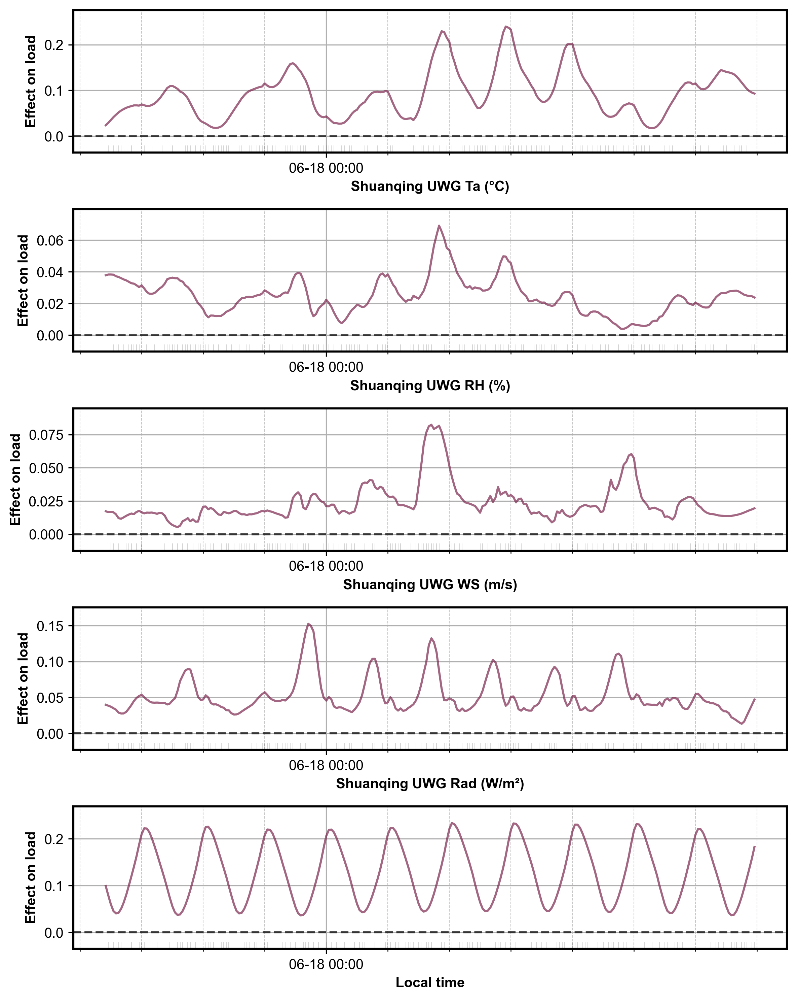

In [74]:
# 创建一个包含特征名称的列表
feature_names_shap = target_cols

# 设置子图的行和列数
num_rows = num_features
num_features = len(feature_names_shap)
num_cols = 1

# 创建一个新的图形和轴对象
fig = plt.figure(figsize=(8, num_features*2), dpi=300)
gs = GridSpec(num_rows, num_cols, figure=fig)

# 对特征进行循环
for i in range(num_rows):
    for j in range(num_cols):
        # 计算特征索引
        feature_index = i * num_cols + j
        
        # 如果特征索引大于等于20，终止循环
        if feature_index >= num_features:
            break
        
        # 提取特征数据和对应的SHAP值
        x_values = df_shap.index
        y_values = df_shap.iloc[:, feature_index]
        
        # 在GridSpec中创建子图
        ax = fig.add_subplot(gs[i, j])
        
        # 绘制散点图
        ax.plot(x_values, y_values, color='#7d264e', alpha=0.7, linewidth=1.5)
        
        # 添加 y=0 处的粗虚线
        ax.axhline(y=0, color='k', linestyle='--', linewidth=1.5, alpha=0.7)  
        
        # 添加轴须图（随机抽样 1/2）
        sample_indices = np.random.choice(len(x_values), size=len(x_values) // 2, replace=False)
        sampled_x_values = x_values[sample_indices]
        sns.rugplot(x=sampled_x_values, ax=ax, color='black', alpha=0.8, linewidth=0.1, height=0.05)
        
        # 设置标题和标签
        ax.set_xlabel('{}'.format(feature_names_shap[feature_index]), fontname='Arial', fontsize=10, weight='bold')
        
        # 仅为第一列设置 ylabel
        if j == 0:
            ax.set_ylabel('Effect on load', fontname='Arial', fontsize=10, fontweight='bold')
        else:
            ax.set_ylabel('')  # 移除其他列的 ylabel
        
        # 添加黑框
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # 黑色边框
            spine.set_linewidth(1.5)      # 边框宽度          
        
        # 添加网格
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=8))  
        ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 48]))  
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))  # 仅显示月-日
        ax.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.7)  # 细网格线
        ax.grid(which='major', linestyle='-', linewidth=0.8, alpha=1)  # 主要网格线
        
        # 设置yticks字体增加
        ax.tick_params(axis='both', labelsize=10)
        
        # 获取刻度标签对象
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontname('Arial')  # 设置字体

# 调整子图之间的间距
plt.tight_layout()
plt.subplots_adjust(wspace=0.4)
plt.show()

##### 堆积折线图（日周期 二联图）

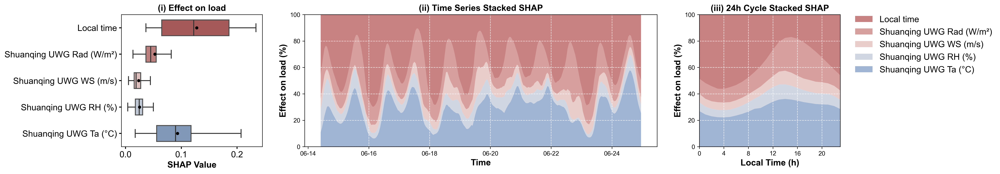

In [76]:
# 提取小时信息
df_shap['hour'] = df_shap.index.hour

# 计算每个特征的 24 小时均值并转换为百分比
shap_cycle = df_shap.groupby('hour').mean(numeric_only=True)[feature_names_shap]
shap_cycle_pct = shap_cycle.div(shap_cycle.sum(axis=1), axis=0) * 100  # 转换为百分比

# 计算整个时间序列的 SHAP 值并转换为百分比
df_shap_pct = df_shap[feature_names_shap].div(df_shap[feature_names_shap].sum(axis=1), axis=0) * 100

# 创建图形和 GridSpec 对象
fig = plt.figure(figsize=(22.5, 4), dpi=300)
gs = GridSpec(1, 3, width_ratios=[1, 2.5, 1], figure=fig)  # 左小右大

# 颜色方案
palette = sns.color_palette("vlag", len(feature_names_shap))
highlight_index = 2  # 需要突出显示的变量索引
highlight_color = (0.7, 0.3, 0.3)  # 更温和的红色
palette[-2], palette[-3] = palette[-1], palette[-2]
palette[-1] = highlight_color  # 将该颜色放到 palette 的第一个位置

# ========== 右侧 特征箱线图 ==========
ax1 = fig.add_subplot(gs[0, 0])

# 绘制箱线图，按列指定颜色
sns.boxplot(data=df_shap[feature_names_shap], ax=ax1,
            showfliers=False,  # 取消显示异常值
            showmeans=True,  # 显示均值
            orient='h',  # 横向箱线图
            width=0.6,  # 使箱体变瘦
            linewidth=1.5,
            palette=palette,  # 应用调整后的色板
            whiskerprops=dict(color="#333333"),
            capprops=dict(color="#333333"),
            medianprops=dict(color="#333333", linewidth=1.5),  # 中位数线样式
            meanprops=dict(marker='o', markerfacecolor='k', markeredgecolor='k', markersize=4))  # 均值样式

# 设置标题和刻度
ax1.set_title("(i) Effect on load", fontsize=14, fontweight='bold')  # 标题
ax1.tick_params(axis='both', labelsize=14, width=1.5)  # 设置刻度字号和加粗

# # 将刻度标注移到右边
# ax1.tick_params(axis='y', labelleft=False, labelright=True)  # 隐藏左边刻度，显示右边刻度

# # 将刻度线移到右边
# ax1.yaxis.set_ticks_position('right')  # 将刻度轴移到右边

# 反转 x 轴的顺序
ax1.invert_yaxis()

# 添加 y 轴标签
ax1.set_xlabel('SHAP Value', fontsize=14, fontweight='bold')

# ========== 中间 时间序列百分比堆积折线图 ==========
ax2 = fig.add_subplot(gs[0, 1])
ax2.stackplot(df_shap.index, df_shap_pct.T, labels=feature_names_shap, colors=palette, alpha=0.7)
ax2.set_xlabel('Time', fontsize=14, fontweight='bold')
ax2.set_ylabel('Effect on load (%)', fontsize=14, fontweight='bold')
ax2.set_ylim(0, 100)  # 设定 y 轴范围 0-100%
ax2.set_title('(ii) Time Series Stacked SHAP', fontsize=14, fontweight='bold')

# 设置时间格式
ax2.xaxis.set_major_locator(mdates.DayLocator(interval=2))  # 7 天间隔
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax2.grid(True, linestyle='--', alpha=0.8, color='white')
# ax2.legend(fontsize=14, loc='upper left', bbox_to_anchor=(1, 1))

# ========== 左侧 24 小时循环百分比堆积折线图 ==========
ax3 = fig.add_subplot(gs[0, 2])
ax3.stackplot(shap_cycle_pct.index, shap_cycle_pct.T, labels=feature_names_shap, colors=palette, alpha=0.7)
ax3.set_xlabel('Local Time (h)', fontsize=14, fontweight='bold')
ax3.set_ylabel('Effect on load (%)', fontsize=14, fontweight='bold')
ax3.set_xticks(range(0, 24, 4))  # 每 4 小时一个刻度
ax3.set_xlim(0, 23)
ax3.set_ylim(0, 100)  # 设定 y 轴范围 0-100%
ax3.set_title('(iii) 24h Cycle Stacked SHAP', fontsize=14, fontweight='bold')
ax3.grid(True, linestyle='--', alpha=0.8, color='white')

# 反转图例顺序
handles, labels = ax3.get_legend_handles_labels()
ax3.legend(handles[::-1], labels[::-1], fontsize=14, loc='upper left', bbox_to_anchor=(1.05, 1.05), frameon=False)

# # ========== 整体图例 ========== 
# fig.legend(labels=feature_names_shap, loc='center left', bbox_to_anchor=(1.05, 0.5), fontsize=14, frameon=False)

# 调整布局
plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.show()

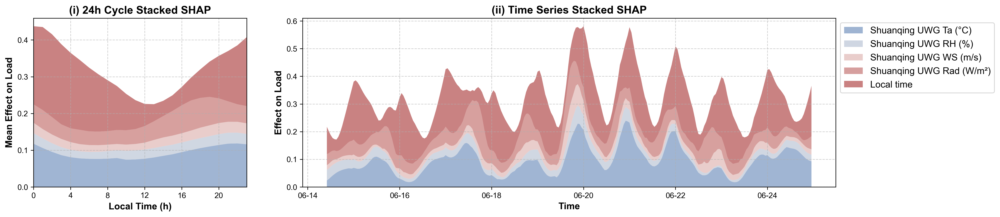

In [77]:
# 提取小时信息
df_shap['hour'] = df_shap.index.hour

# 计算每个特征的 24 小时均值
shap_cycle = df_shap.groupby('hour').mean(numeric_only=True)[feature_names_shap]

# 创建图形和 GridSpec 对象
fig = plt.figure(figsize=(18, 4), dpi=300)
gs = GridSpec(1, 2, width_ratios=[1, 2.5], figure=fig)  # 左小右大

# 颜色方案
palette = sns.color_palette("vlag", len(feature_names_shap))
highlight_index = 2  # 需要突出显示的变量索引
highlight_color = (0.7, 0.3, 0.3)  # 更温和的红色
palette[-2], palette[-3] = palette[-1], palette[-2]
palette[-1] = highlight_color  # 将该颜色放到 palette 的第一个位置

# ========== 左侧 24 小时循环堆积折线图 ==========
ax1 = fig.add_subplot(gs[0, 0])
ax1.stackplot(shap_cycle.index, shap_cycle.T, labels=feature_names_shap, colors=palette, alpha=0.7)
ax1.set_xlabel('Local Time (h)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Mean Effect on Load', fontsize=12, fontweight='bold')
ax1.set_xticks(range(0, 24, 4))  # 每 4 小时一个刻度
ax1.set_xlim(0, 23)
ax1.set_title('(i) 24h Cycle Stacked SHAP', fontsize=14, fontweight='bold')
# ax1.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
ax1.grid(True, linestyle='--', alpha=0.6)

# ========== 右侧 时间序列堆积折线图 ==========
ax2 = fig.add_subplot(gs[0, 1])
ax2.stackplot(df_shap.index, df_shap[feature_names_shap].T, labels=feature_names_shap, colors=palette, alpha=0.7)
ax2.set_xlabel('Time', fontsize=12, fontweight='bold')
ax2.set_ylabel('Effect on Load', fontsize=12, fontweight='bold')
ax2.set_title('(ii) Time Series Stacked SHAP', fontsize=14, fontweight='bold')

# 设置时间格式
ax2.xaxis.set_major_locator(mdates.DayLocator(interval=2))  # 7 天间隔
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))

# 调整布局
plt.tight_layout()
plt.subplots_adjust(wspace=0.15)
plt.show()

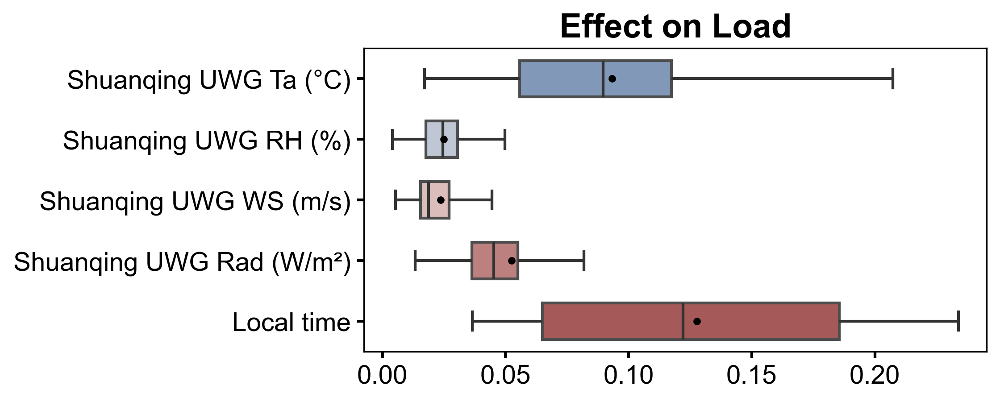

In [78]:
# 颜色方案
palette = sns.color_palette("vlag", len(feature_names_shap))
highlight_index = 2  # 需要突出显示的变量索引
highlight_color = (0.7, 0.3, 0.3)  # 更温和的红色
palette[-2], palette[-3] = palette[-1], palette[-2]
palette[-1] = highlight_color  # 将该颜色放到最后一个位置

# 设置图表布局
fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

# 绘制箱线图，按列指定颜色
sns.boxplot(data=df_shap[feature_names_shap], ax=ax,
            showfliers=False,  # 取消显示异常值
            showmeans=True,  # 显示均值
            orient='h',  # 横向箱线图
            width=0.6,  # 使箱体变瘦
            linewidth=1.5,
            palette=palette,  # 应用调整后的色板
            whiskerprops=dict(color="#333333"),
            capprops=dict(color="#333333"),
            medianprops=dict(color="#333333", linewidth=1.5),  # 中位数线样式
            meanprops=dict(marker='o', markerfacecolor='k', markeredgecolor='k', markersize=3))  # 均值样式

# 设置标题和刻度
ax.set_title("Effect on Load", fontsize=18, fontweight='bold')  # 标题
ax.tick_params(axis='both', labelsize=14, width=1.5)  # 设置刻度字号和加粗

plt.show()

In [79]:
# 夏季极端天气下 外扰比重增加 内扰影响的比重会下降 